# Introduction

## About the dataset:
This dataset contains information on default payments, demographic factors, credit data, history of payment, and bill statements of credit card clients in Taiwan from April 2005 to September 2005. 

## Features:
There are 25 features:

* ID: ID of each client
* LIMIT_BAL: Amount of given credit in NT dollars (includes individual and family/supplementary credit
* SEX: Gender (1=male, 2=female)
* EDUCATION: (1=graduate school, 2=university, 3=high school, 4=others, 5=unknown, 6=unknown)
* MARRIAGE: Marital status (1=married, 2=single, 3=others)
* AGE: Age in years
* PAY_0: Repayment status in September, 2005 (-1=pay duly, 1=payment delay for one month, 2=payment delay for two months, ... 8=payment delay for eight months, 9=payment delay for nine months and above)
* PAY_2: Repayment status in August, 2005 (scale same as above)
* PAY_3: Repayment status in July, 2005 (scale same as above)
* PAY_4: Repayment status in June, 2005 (scale same as above)
* PAY_5: Repayment status in May, 2005 (scale same as above)
* PAY_6: Repayment status in April, 2005 (scale same as above)
* BILL_AMT1: Amount of bill statement in September, 2005 (NT dollar)
* BILL_AMT2: Amount of bill statement in August, 2005 (NT dollar)
* BILL_AMT3: Amount of bill statement in July, 2005 (NT dollar)
* BILL_AMT4: Amount of bill statement in June, 2005 (NT dollar)
* BILL_AMT5: Amount of bill statement in May, 2005 (NT dollar)
* BILL_AMT6: Amount of bill statement in April, 2005 (NT dollar)
* PAY_AMT1: Amount of previous payment in September, 2005 (NT dollar)
* PAY_AMT2: Amount of previous payment in August, 2005 (NT dollar)
* PAY_AMT3: Amount of previous payment in July, 2005 (NT dollar)
* PAY_AMT4: Amount of previous payment in June, 2005 (NT dollar)
* PAY_AMT5: Amount of previous payment in May, 2005 (NT dollar)
* PAY_AMT6: Amount of previous payment in April, 2005 (NT dollar)
* default.payment.next.month: Default payment (1=yes, 0=no)

## Overview:

This is one of my early data science projects. I've used my skills like data cleaning, data analysis, data visualization and machine learning. I hope to carry out a research and to build several ML models to predict defaulters of credit card payments and compare their performance.

This notebook consisits of the following parts:

1) Missing Value Imputation

2) Exploratory Data Analysis

3) Data cleaning and further exploration

4) Building a base model

5) Feature Engineering

6) Building ML model using various algorithms and comparing them

7) Conclusion


In [1]:
# Import basic libraries
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

#import plotly.plotly as py
%matplotlib inline
pd.set_option('display.max_columns',None)
sns.set(style="darkgrid", palette="pastel", color_codes=True)
sns.set_context('paper')

import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.io as pio
pio.templates.default = "plotly_dark"
from plotly.offline import init_notebook_mode, iplot

from sklearn.linear_model import LogisticRegression
from sklearn.utils import resample 
from imblearn.over_sampling import SMOTE
from sklearn.feature_selection import RFE,SelectFromModel
from sklearn.model_selection import KFold,GridSearchCV,RandomizedSearchCV,train_test_split # for cross validation
from sklearn.preprocessing import StandardScaler # for normalization
from sklearn.pipeline import Pipeline 
from sklearn.naive_bayes import GaussianNB
from scipy.stats import randint as sp_randint
from sklearn.ensemble import RandomForestClassifier ,ExtraTreesClassifier, AdaBoostClassifier,GradientBoostingClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report,confusion_matrix,f1_score,roc_auc_score,roc_curve,accuracy_score
from sklearn.neighbors import KNeighborsClassifier #KNN
from sklearn.tree import DecisionTreeClassifier
import plotly.figure_factory as ff 
import scipy.stats as st
import warnings
warnings.filterwarnings("ignore")

import random
random.seed(10)

D:\Softwares\Anaconda3\lib\site-packages\dask\dataframe\utils.py:14: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



In [42]:
# Load the data
df = pd.read_csv('C:\\Users\\suraj\\Downloads\\Assignment-HousingDataset.csv')
df.head(5)

,row ID,BATHRM,HF_BATHRM,HEAT,HEAT_D,AC,NUM_UNITS,ROOMS,BEDRM,AYB,YR_RMDL,EYB,STORIES,SALEDATE,PRICE,SALE_NUM,GBA,BLDG_NUM,STYLE,STYLE_D,STRUCT,STRUCT_D,GRADE,GRADE_D,CNDTN,CNDTN_D,EXTWALL,EXTWALL_D,ROOF,ROOF_D,INTWALL,INTWALL_D,KITCHENS,FIREPLACES,USECODE,LANDAREA,GIS_LAST_MOD_DTTM,QUALIFIED
0,Row0,3.0,1.0,7.0,Warm Cool,Y,2.0,11.0,5.0,1898.0,2007.0,1972,3.0,2000-08-17T00:00:00.000Z,0.0,1,2567,1,7.0,3 Story,7.0,Row Inside,6.0,Very Good,4.0,Good,14.0,Common Brick,2.0,Built Up,6.0,Hardwood,2.0,4.0,24,1680,2018-07-22T18:01:43.000Z,0
1,Row1,3.0,1.0,13.0,Hot Water Rad,Y,2.0,9.0,5.0,1910.0,2009.0,1984,3.0,2016-06-21T00:00:00.000Z,2100000.0,3,2522,1,7.0,3 Story,7.0,Row Inside,6.0,Very Good,5.0,Very Good,14.0,Common Brick,2.0,Built Up,6.0,Hardwood,2.0,4.0,24,1680,2018-07-22T18:01:43.000Z,1
2,Row2,2.0,1.0,7.0,Warm Cool,Y,1.0,11.0,3.0,1913.0,2012.0,1985,3.0,1900-01-01T00:00:00.000Z,NaN,1,5255,1,7.0,3 Story,8.0,Semi-Detached,6.0,Very Good,4.0,Good,14.0,Common Brick,13.0,Neopren,6.0,Hardwood,1.0,0.0,13,2032,2018-07-22T18:01:43.000Z,0
3,Row3,3.0,2.0,13.0,Hot Water Rad,Y,1.0,10.0,5.0,1913.0,NaN,1972,4.0,2010-02-26T00:00:00.000Z,1950000.0,1,5344,1,10.0,4 Story,7.0,Row Inside,6.0,Very Good,4.0,Good,14.0,Common Brick,2.0,Built Up,6.0,Hardwood,1.0,4.0,11,2196,2018-07-22T18:01:43.000Z,1
4,Row4,3.0,1.0,7.0,Warm Cool,Y,2.0,7.0,3.0,1908.0,2008.0,1967,2.0,2018-05-03T00:00:00.000Z,1430000.0,4,1488,1,4.0,2 Story,7.0,Row Inside,4.0,Above Average,5.0,Very Good,14.0,Common Brick,2.0,Built Up,6.0,Hardwood,2.0,1.0,24,1424,2018-07-22T18:01:43.000Z,1


#### Shape of Data:

In [43]:
df.shape

(75007, 38)

# 1) Missing Value Imputation:

In [44]:
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(30)

,Total,Percent
YR_RMDL,40473,0.539590
PRICE,13506,0.180063
STORIES,52,0.000693
ROOMS,32,0.000427
BEDRM,24,0.000320
HF_BATHRM,21,0.000280
FIREPLACES,21,0.000280
KITCHENS,21,0.000280
STRUCT_D,20,0.000267
NUM_UNITS,20,0.000267


In [45]:
df = df.dropna(subset=['FIREPLACES','STORIES','ROOMS','AYB','BEDRM','HF_BATHRM','KITCHENS'])
df.reset_index(inplace = True, drop = True)
df['PRICE'] = df['PRICE'].fillna(value = df['PRICE'].median())
df['YR_RMDL'] = df['YR_RMDL'].fillna(value = "nan")

In [46]:
for i in range(len(df)):
    if df.loc[i,'YR_RMDL'] == "nan":
        df.loc[i,'YR_RMDL'] = df.loc[i,'SALEDATE'].split('-')[0]

#### After Imputing Nan Values: 

In [47]:
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(30)

,Total,Percent
QUALIFIED,0,0.0
AYB,0,0.0
GBA,0,0.0
SALE_NUM,0,0.0
PRICE,0,0.0
SALEDATE,0,0.0
STORIES,0,0.0
EYB,0,0.0
YR_RMDL,0,0.0
BEDRM,0,0.0


In [22]:
#missing_data.to_excel("Missing.xlsx")

#### All the missing values have been imputed

#### Now let's check dtypes of each feature

In [396]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74929 entries, 0 to 74928
Data columns (total 38 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   row ID             74929 non-null  object 
 1   BATHRM             74929 non-null  float64
 2   HF_BATHRM          74929 non-null  float64
 3   HEAT               74929 non-null  float64
 4   HEAT_D             74929 non-null  object 
 5   AC                 74929 non-null  object 
 6   NUM_UNITS          74929 non-null  float64
 7   ROOMS              74929 non-null  float64
 8   BEDRM              74929 non-null  float64
 9   AYB                74929 non-null  float64
 10  YR_RMDL            74929 non-null  object 
 11  EYB                74929 non-null  int64  
 12  STORIES            74929 non-null  float64
 13  SALEDATE           74929 non-null  object 
 14  PRICE              74929 non-null  float64
 15  SALE_NUM           74929 non-null  int64  
 16  GBA                749

### Statistical description of the features:

##### 1) Numerical features:

In [397]:
df.describe(exclude = "object")

,BATHRM,HF_BATHRM,HEAT,NUM_UNITS,ROOMS,BEDRM,AYB,EYB,STORIES,PRICE,SALE_NUM,GBA,BLDG_NUM,STYLE,STRUCT,GRADE,CNDTN,EXTWALL,ROOF,INTWALL,KITCHENS,FIREPLACES,USECODE,LANDAREA,QUALIFIED
count,74929.000000,74929.000000,74929.000000,74929.000000,74929.000000,74929.000000,74929.000000,74929.000000,74929.000000,7.492900e+04,74929.000000,74929.000000,74929.000000,74929.000000,74929.000000,74929.000000,74929.000000,74929.000000,74929.000000,74929.000000,74929.000000,74929.000000,74929.000000,74929.000000,74929.000000
mean,2.034753,0.608162,7.649388,1.195839,7.356538,3.372593,1930.191902,1966.236304,2.096005,3.576240e+05,1.615823,1715.818855,1.000827,4.345100,5.002029,4.268027,3.525831,13.354162,3.992967,6.144323,1.217406,0.619653,13.123570,3412.073029,0.430928
std,1.066792,0.617123,5.037602,0.593629,2.352646,1.168750,90.090020,16.390242,3.337724,5.257761e+05,1.277260,873.298649,0.036523,1.580288,2.878338,1.369073,0.714600,3.936090,3.351350,1.960578,0.624570,0.889363,3.971153,5211.380693,0.495209
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1900.000000,0.000000,0.000000e+00,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11.000000,0.000000,0.000000
25%,1.000000,0.000000,1.000000,1.000000,6.000000,3.000000,1914.000000,1955.000000,2.000000,0.000000e+00,1.000000,1193.000000,1.000000,4.000000,1.000000,3.000000,3.000000,14.000000,1.000000,6.000000,1.000000,0.000000,11.000000,1600.000000,0.000000
50%,2.000000,1.000000,7.000000,1.000000,7.000000,3.000000,1930.000000,1964.000000,2.000000,2.380000e+05,1.000000,1480.000000,1.000000,4.000000,7.000000,4.000000,3.000000,14.000000,2.000000,6.000000,1.000000,0.000000,12.000000,2370.000000,0.000000
75%,3.000000,1.000000,13.000000,1.000000,8.000000,4.000000,1947.000000,1970.000000,2.000000,4.820000e+05,1.000000,1967.000000,1.000000,4.000000,7.000000,5.000000,4.000000,14.000000,6.000000,6.000000,1.000000,1.000000,13.000000,4200.000000,1.000000
max,24.000000,11.000000,13.000000,6.000000,101.000000,54.000000,2018.000000,2018.000000,826.000000,2.510000e+07,15.000000,41604.000000,5.000000,99.000000,13.000000,12.000000,6.000000,24.000000,15.000000,11.000000,44.000000,13.000000,81.000000,691817.000000,1.000000


##### 2) Categorical features:

In [398]:
df.describe(include = "object")

,row ID,HEAT_D,AC,YR_RMDL,SALEDATE,STYLE_D,STRUCT_D,GRADE_D,CNDTN_D,EXTWALL_D,ROOF_D,INTWALL_D,GIS_LAST_MOD_DTTM
count,74929,74929,74929,74929,74929,74929,74929,74929,74929,74929,74929,74929,74929
unique,74929,14,3,168,6634,18,9,13,7,25,16,12,1
top,Row9193,Hot Water Rad,Y,1900,1900-01-01T00:00:00.000Z,2 Story,Row Inside,Average,Average,Common Brick,Built Up,Hardwood,2018-07-22T18:01:43.000Z
freq,1,30804,46550,11571,15858,56943,28442,26286,40794,56876,22009,58661,74929


#### Since index and row ID has just unique values. We will drop it for now

In [54]:
df = df.drop(['row ID'], axis=1)

# 2) Exploratory Data Anaysis:

##### 1) Heating Description:

In [7]:
heat_count = df['HEAT_D'].value_counts().reset_index().rename(columns={'index':'index','HEAT_D':'count'})

In [8]:
fig = go.Figure(go.Bar(
    x = heat_count['index'],y = heat_count['count'],text=heat_count['count'],marker={'color': heat_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Heating Description',xaxis_title="Heating Description",yaxis_title="Number of count")
fig.show()

##### A lot of values with very less count

##### 2) AC:

In [9]:
ac_count = df['AC'].value_counts().reset_index().rename(columns={'index':'index','AC':'count'})

In [10]:
ac_count

,index,count
0,Y,46550
1,N,28341
2,0,38


#### AC has value with 0, so replacing that with "NO"

In [11]:
df['AC'] = df['AC'].apply(lambda x : "N" if x == "0" else x)
ac_count = df['AC'].value_counts().reset_index().rename(columns={'index':'index','AC':'count'})
ac_count

,index,count
0,Y,46550
1,N,28379


In [12]:
# edu_count['index'][0] = 'University'
# edu_count['index'][1] = 'Graduate School'
# edu_count['index'][2] = 'High school'
# edu_count['index'][3] = 'Unknown 1'
# edu_count['index'][4] = 'Others'
# edu_count['index'][5] = 'Unknown 2'
# edu_count['index'][6] = 'Unknown 3'

In [13]:
fig = go.Figure(go.Bar(
    x = ac_count['index'],y = ac_count['count'],text = ac_count['count'],marker={'color': ac_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Air Conditioning',xaxis_title="Air Conditioning",yaxis_title="Number of count")
fig.show()

##### It seems to be imbalanced

##### 3) Style Description:

In [14]:
style_count = df['STYLE_D'].value_counts().reset_index().rename(columns={'index':'index','STYLE_D':'count'})

In [15]:
# sex_count['index'][1] = 'Male'
# sex_count['index'][0] = 'Female'

In [16]:
fig = go.Figure(go.Bar(
    x = style_count['index'],y = style_count['count'],text=style_count['count'],marker={'color': style_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Style Description',xaxis_title="Style Description",yaxis_title="Number of count")
fig.show()

##### It seems that there are way lot of 2 story homes

### 4) Structure Description:

In [17]:
struc_count = df['STRUCT_D'].value_counts().reset_index().rename(columns={'index':'index','STRUCT_D':'count'})

fig = go.Figure(go.Bar(
    x = struc_count['index'],y = struc_count['count'],text=struc_count['count'],marker={'color': struc_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Structure Description',xaxis_title="Structure Description",yaxis_title="Number of count")
fig.show()

#### 5) Grade Description:

In [18]:
grade_count = df['GRADE_D'].value_counts().reset_index().rename(columns={'index':'index','GRADE_D':'count'})

fig = go.Figure(go.Bar(
    x = grade_count['index'],y = grade_count['count'],text=grade_count['count'],marker={'color': grade_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Grade Description',xaxis_title="Grade Description",yaxis_title="Number of count")
fig.show()

#### 6) Condition Description:

In [19]:
condition_count = df['CNDTN_D'].value_counts().reset_index().rename(columns={'index':'index','CNDTN_D':'count'})

fig = go.Figure(go.Bar(
    x = condition_count['index'],y = condition_count['count'],text=condition_count['count'],marker={'color': condition_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Condition Description',xaxis_title="Condition Description",yaxis_title="Number of count")
fig.show()

#### 7) Exterior Wall Description:

In [20]:
wall_count = df['EXTWALL_D'].value_counts().reset_index().rename(columns={'index':'index','EXTWALL_D':'count'})

fig = go.Figure(go.Bar(
    x = wall_count['index'],y = wall_count['count'],text=wall_count['count'],marker={'color': wall_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Wall Description',xaxis_title="Wall Description",yaxis_title="Number of count")
fig.show()

#### 8) Roof Description:

In [21]:
roof_count = df['ROOF_D'].value_counts().reset_index().rename(columns={'index':'index','ROOF_D':'count'})

fig = go.Figure(go.Bar(
    x = roof_count['index'],y = roof_count['count'],text=roof_count['count'],marker={'color': roof_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Roof Description',xaxis_title="Roof Description",yaxis_title="Number of count")
fig.show()

#### 8) Interior Wall Description:

In [22]:
int_count = df['INTWALL_D'].value_counts().reset_index().rename(columns={'index':'index','INTWALL_D':'count'})

fig = go.Figure(go.Bar(
    x = int_count['index'],y = int_count['count'],text = int_count['count'],marker={'color': roof_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Interior Wall Description',xaxis_title="Interior Wall Description",yaxis_title="Number of count")
fig.show()

#### 9) Kitchens:

In [23]:
kitc_count = df['KITCHENS'].value_counts().reset_index().rename(columns={'index':'index','KITCHENS':'count'})

fig = go.Figure(go.Bar(
    x = kitc_count['index'],y = kitc_count['count'],text = kitc_count['count'],marker={'color': kitc_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Kitchens',xaxis_title="Kitchens",yaxis_title="Number of count")
fig.show()

#### 9) Fireplaces:

In [24]:
fire_count = df['FIREPLACES'].value_counts().reset_index().rename(columns={'index':'index','FIREPLACES':'count'})

fig = go.Figure(go.Bar(
    x = fire_count['index'],y = fire_count['count'],text = fire_count['count'],marker={'color': fire_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Fireplaces',xaxis_title="Fireplaces",yaxis_title="Number of count")
fig.show()

#### 10) Usecode:

In [25]:
code_count = df['USECODE'].value_counts().reset_index().rename(columns={'index':'index','USECODE':'count'})

fig = go.Figure(go.Bar(
    x = code_count['index'],y = code_count['count'],text = code_count['count'],marker={'color': code_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Use Code',xaxis_title="Use Code",yaxis_title="Number of count")
fig.show()

#### 11) Qualified:

In [26]:
qua_count = df['QUALIFIED'].value_counts().reset_index().rename(columns={'index':'index','QUALIFIED':'count'})

fig = go.Figure(go.Bar(
    x = qua_count['index'],y = qua_count['count'],text = qua_count['count'],marker={'color': qua_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Qualified',xaxis_title="Qualified",yaxis_title="Number of count")
fig.show()

#### 12) Bathroom:

In [27]:
bath_count = df['BATHRM'].value_counts().reset_index().rename(columns={'index':'index','BATHRM':'count'})

fig = go.Figure(go.Bar(
    x = bath_count['index'],y = bath_count['count'],text = bath_count['count'],marker={'color': bath_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Bathroom',xaxis_title="Bathroom",yaxis_title="Number of count")
fig.show()

#### 13) Half Bathroom:

In [28]:
half_count = df['HF_BATHRM'].value_counts().reset_index().rename(columns={'index':'index','HF_BATHRM':'count'})

fig = go.Figure(go.Bar(
    x = half_count['index'],y = half_count['count'],text = half_count['count'],marker={'color': half_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Half Bathroom',xaxis_title="Half Bathroom",yaxis_title="Number of count")
fig.show()

#### 14) Number of Rooms:

In [29]:
no_count = df['ROOMS'].value_counts().reset_index().rename(columns={'index':'index','ROOMS':'count'})

fig = go.Figure(go.Bar(
    x = no_count['index'],y = no_count['count'],text = no_count['count'],marker={'color': no_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Rooms',xaxis_title="Rooms",yaxis_title="Number of count")
fig.show()

#### 15) Number of Bed Rooms:

In [30]:
bed_count = df['BEDRM'].value_counts().reset_index().rename(columns={'index':'index','BEDRM':'count'})

fig = go.Figure(go.Bar(
    x = bed_count['index'],y = bed_count['count'],text = bed_count['count'],marker={'color': bed_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Bed Rooms',xaxis_title="Bed Rooms",yaxis_title="Number of count")
fig.show()

#### 16) No. of units:

In [31]:
bed_count = df['NUM_UNITS'].value_counts().reset_index().rename(columns={'index':'index','NUM_UNITS':'count'})

fig = go.Figure(go.Bar(
    x = bed_count['index'],y = bed_count['count'],text = bed_count['count'],marker={'color': bed_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of No. of Units',xaxis_title="No. of Units",yaxis_title="Number of count")
fig.show()

#### 17) Stories 

In [32]:
bed_count = df[df['STORIES'] < 10]['STORIES'].value_counts().reset_index().rename(columns={'index':'index','STORIES':'count'})

fig = go.Figure(go.Bar(
    x = bed_count['index'],y = bed_count['count'],text = bed_count['count'],marker={'color': bed_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Stories',xaxis_title="Stories",yaxis_title="Number of count")
fig.show()

#### 18) Sale Number:

In [33]:
bed_count = df['SALE_NUM'].value_counts().reset_index().rename(columns={'index':'index','SALE_NUM':'count'})

fig = go.Figure(go.Bar(
    x = bed_count['index'],y = bed_count['count'],text = bed_count['count'],marker={'color': bed_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Sale Number',xaxis_title="Sale Number",yaxis_title="Number of count")
fig.show()

#### 19) Building Number:

In [34]:
bed_count = df['BLDG_NUM'].value_counts().reset_index().rename(columns={'index':'index','BLDG_NUM':'count'})

fig = go.Figure(go.Bar(
    x = bed_count['index'],y = bed_count['count'],text = bed_count['count'],marker={'color': bed_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Building Number',xaxis_title="Building Number",yaxis_title="Number of count")
fig.show()

In [35]:
num_var = ['AYB','YR_RMDL', 'EYB', 'PRICE', 'GBA', 'LANDAREA']
for i in num_var:
    fig =  go.Figure(data=[go.Histogram(x= df[i])])
    fig.update_layout(title_text='Histogram Plot of ' + i)
    fig.show()

#### transformation might be required!

#### Correlation:

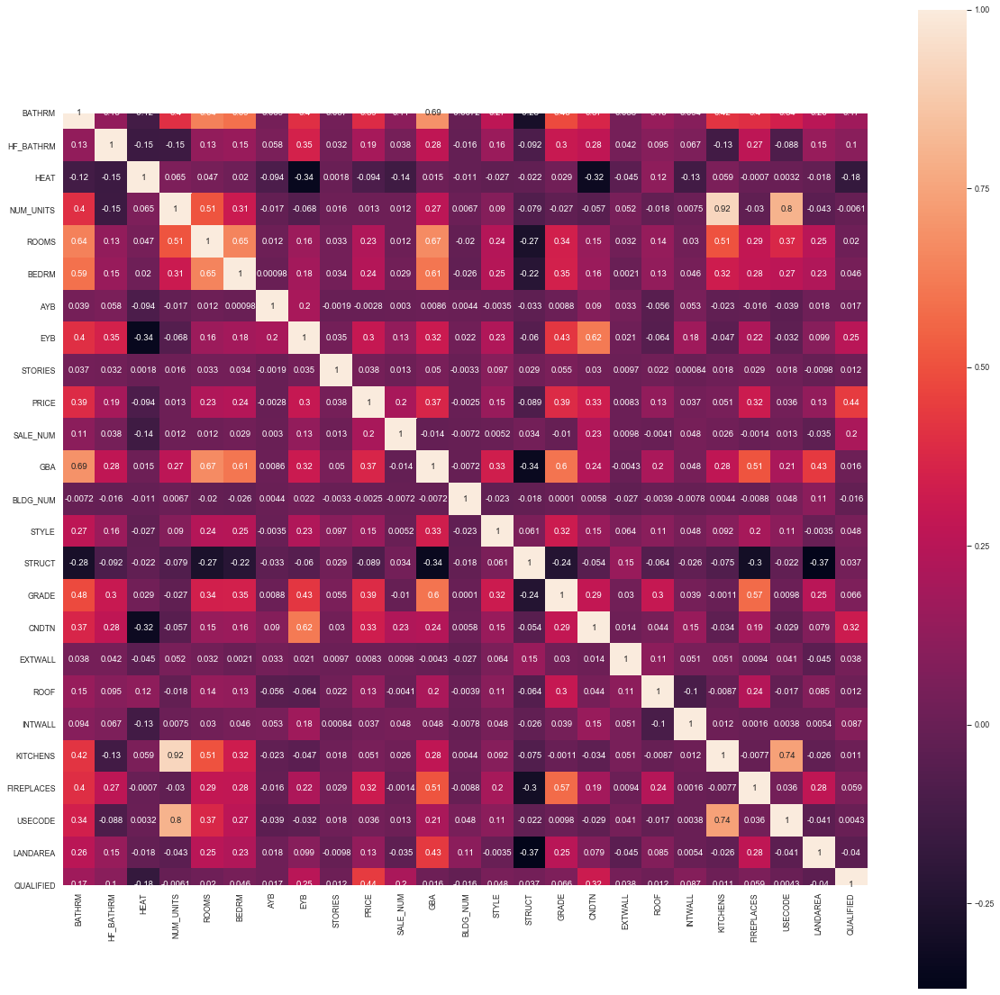

In [402]:
plt.figure(figsize = (20,20))
sns.heatmap(df.corr(),annot = True,square = True)

In [403]:
plt.savefig('correlation.png')

<Figure size 432x288 with 0 Axes>

# 3) Data cleaning and further exploration:

In [48]:
df = df.drop(['HEAT_D','STYLE_D','STRUCT_D','GRADE_D','CNDTN_D','EXTWALL_D','ROOF_D','INTWALL_D','GIS_LAST_MOD_DTTM'], axis=1)

In [49]:
df['AC'] = df['AC'].apply(lambda x : 0 if x == "N" else 1)

In [50]:
df['SALEYEAR'] = df['SALEDATE'].apply(lambda x : str(x)[0:4])

In [51]:
df = df.drop(['SALEDATE'], axis=1)

# 4) Baseline Model:

#### A baseline model that uses heuristics, simple summary statistics, randomness, or machine learning to create predictions for a dataset. You can use these predictions to measure the baseline's performance (e.g., accuracy)-- this metric will then become what you compare any other machine learning algorithm against. So let's build a logistic regression without any hyperparameter tuning or feature engineering

In [55]:
X = df.drop(['QUALIFIED'], axis=1)
#X = X[cols[1:]]
y = df['QUALIFIED']

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, stratify=y, random_state=42)

Accuracy: 0.8339338938564883

              precision    recall  f1-score   support

           0       0.82      0.91      0.86     12792
           1       0.87      0.73      0.79      9687

    accuracy                           0.83     22479
   macro avg       0.84      0.82      0.83     22479
weighted avg       0.84      0.83      0.83     22479


Average 5-Fold CV Score: 0.8327 , Standard deviation: 0.0751


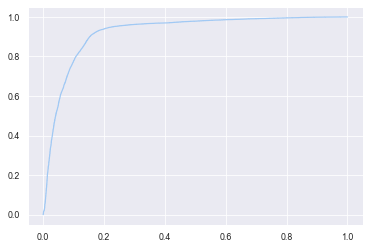

In [56]:
LR = LogisticRegression(random_state=0)
LR.fit(X_train, y_train)
y_pred = LR.predict(X_test)
print('Accuracy:', accuracy_score(y_pred,y_test))

cv_scores = cross_val_score(LR, X, y, cv=5)
print()
print(classification_report(y_test, y_pred))
print()
print("Average 5-Fold CV Score: {}".format(round(np.mean(cv_scores),4)),
      ", Standard deviation: {}".format(round(np.std(cv_scores),4)))
y_test_prob = LR.predict_proba(X_test)[:,1]
fpr,tpr,thresholds = roc_curve(y_test,y_test_prob)
plt.plot(fpr,tpr)

#### So our baseline model has an accuracy of 0.83. We have to better this with other models

# 5) Feature Engineering

### i) Outlier Removal:

In [57]:
object_cols = ['BATHRM','HF_BATHRM','HEAT','NUM_UNITS','ROOMS','BEDRM', 'STORIES','SALE_NUM',
       'BLDG_NUM', 'STYLE', 'STRUCT', 'GRADE', 'CNDTN', 'EXTWALL', 'ROOF',
       'INTWALL', 'KITCHENS', 'FIREPLACES']

In [58]:
my_df = df

for i in object_cols:
    print(i)
    counts = my_df[i].value_counts(normalize = True)
    my_df = my_df.loc[my_df[i].isin(counts.index[counts > 0.05])]
    print("Updated Rows", len(my_df))
    print("_________________________")

BATHRM
Updated Rows 73416
_________________________
HF_BATHRM
Updated Rows 73247
_________________________
HEAT
Updated Rows 71980
_________________________
NUM_UNITS
Updated Rows 69261
_________________________
ROOMS
Updated Rows 64515
_________________________
BEDRM
Updated Rows 63500
_________________________
STORIES
Updated Rows 53370
_________________________
SALE_NUM
Updated Rows 50765
_________________________
BLDG_NUM
Updated Rows 50757
_________________________
STYLE
Updated Rows 50435
_________________________
STRUCT
Updated Rows 49285
_________________________
GRADE
Updated Rows 47154
_________________________
CNDTN
Updated Rows 46149
_________________________
EXTWALL
Updated Rows 39416
_________________________
ROOF
Updated Rows 38337
_________________________
INTWALL
Updated Rows 37111
_________________________
KITCHENS
Updated Rows 37065
_________________________
FIREPLACES
Updated Rows 36560
_________________________


In [59]:
X = my_df.drop(['QUALIFIED'], axis=1)
#X = X[cols[1:]]
y = my_df['QUALIFIED']

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, stratify=y, random_state=42)

Accuracy: 0.8512946754194018

              precision    recall  f1-score   support

           0       0.85      0.91      0.88      6360
           1       0.86      0.77      0.81      4608

    accuracy                           0.85     10968
   macro avg       0.85      0.84      0.85     10968
weighted avg       0.85      0.85      0.85     10968


Average 5-Fold CV Score: 0.8381 , Standard deviation: 0.0668


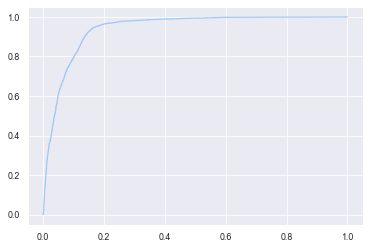

In [60]:
LR = LogisticRegression(random_state=0)
LR.fit(X_train, y_train)
y_pred = LR.predict(X_test)
print('Accuracy:', accuracy_score(y_pred,y_test))

cv_scores = cross_val_score(LR, X, y, cv=5)
print()
print(classification_report(y_test, y_pred))
print()
print("Average 5-Fold CV Score: {}".format(round(np.mean(cv_scores),4)),
      ", Standard deviation: {}".format(round(np.std(cv_scores),4)))
y_test_prob = LR.predict_proba(X_test)[:,1]
fpr,tpr,thresholds = roc_curve(y_test,y_test_prob)
plt.plot(fpr,tpr)

#### The Accuracy improved to 0.85

### ii) Transform Numerical Values:

Following transformations will be applied and the best out of the lot will be selected:

1)Log transformation

2)Reciprocal transformation

3)Square root and Cube root transformation

4)Exponential transformation

5)Boxcox transformation


#### Before transformation

In [61]:
num_var = ['AYB','YR_RMDL', 'EYB', 'PRICE', 'GBA', 'LANDAREA']

In [62]:
(my_df['YR_RMDL']) = (my_df['YR_RMDL']).astype('int')

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001FB8C687508>,
      dtype=object)

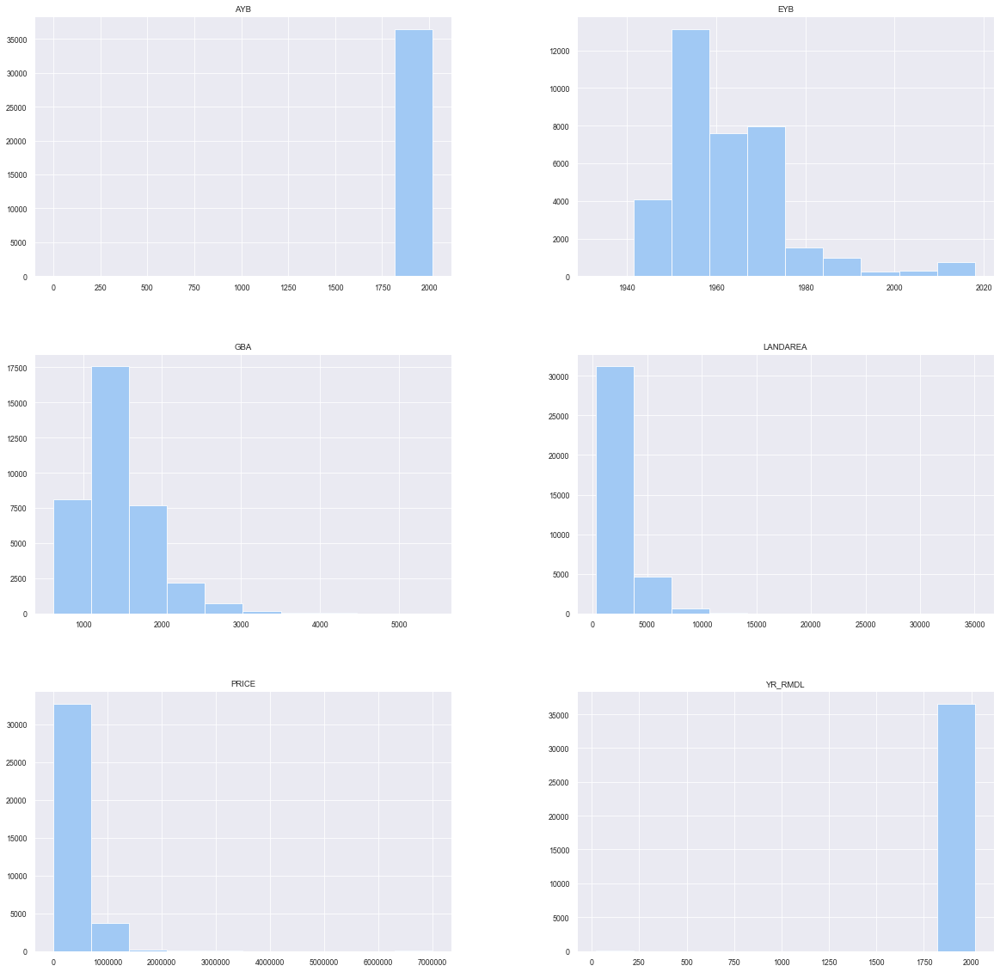

In [63]:
my_df.hist(column = num_var , figsize=(20,20))

#### Checking the best transformation:

AYB 

        Transformation       Skew
                Actual -22.111553
                   Log -25.207243
            Reciprocal  25.267715
 Exponential power 0.2 -25.129146
 Exponential power 0.3 -24.957248
           Square Root -24.418216
             Cube Root -24.885151
                Boxcox  -0.314934

 Best Transformation for  AYB : 
 Boxcox = -0.31493421609996763


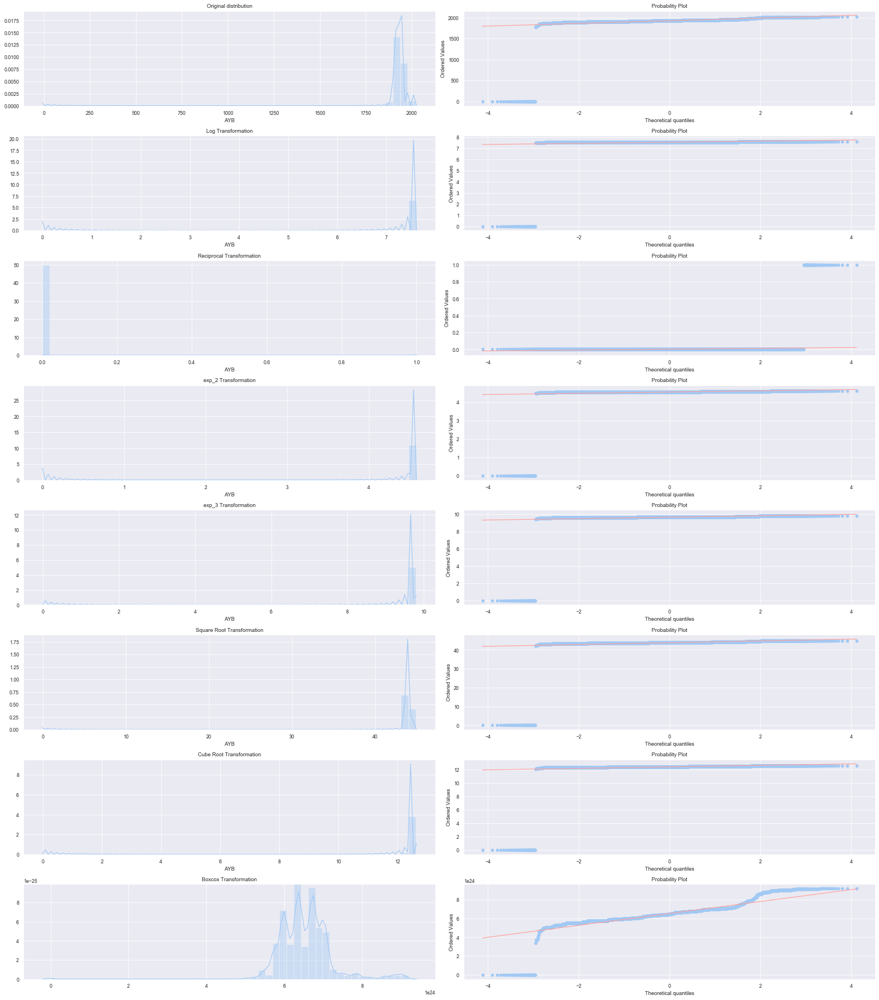

YR_RMDL 

        Transformation        Skew
                Actual   -3.956431
                   Log  -79.949144
            Reciprocal  190.652477
 Exponential power 0.2  -41.320708
 Exponential power 0.3  -28.609754
           Square Root  -14.064201
             Cube Root  -25.311979
                Boxcox         NaN

 Best Transformation for  YR_RMDL : 
 Actual = -3.956430846279496


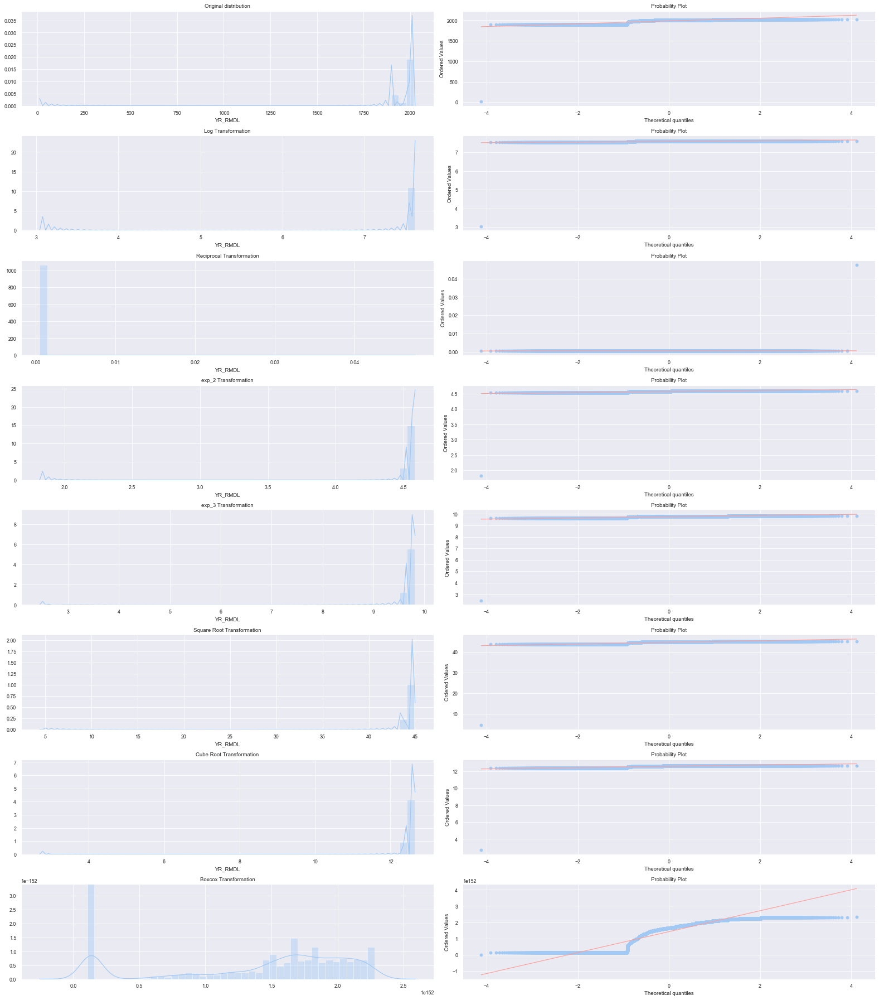

EYB 

        Transformation      Skew
                Actual  1.638344
                   Log  1.604075
            Reciprocal -1.570035
 Exponential power 0.2  1.610897
 Exponential power 0.3  1.614320
           Square Root  1.621173
             Cube Root  1.615462
                Boxcox  0.000000

 Best Transformation for  EYB : 
 Boxcox = 0.0


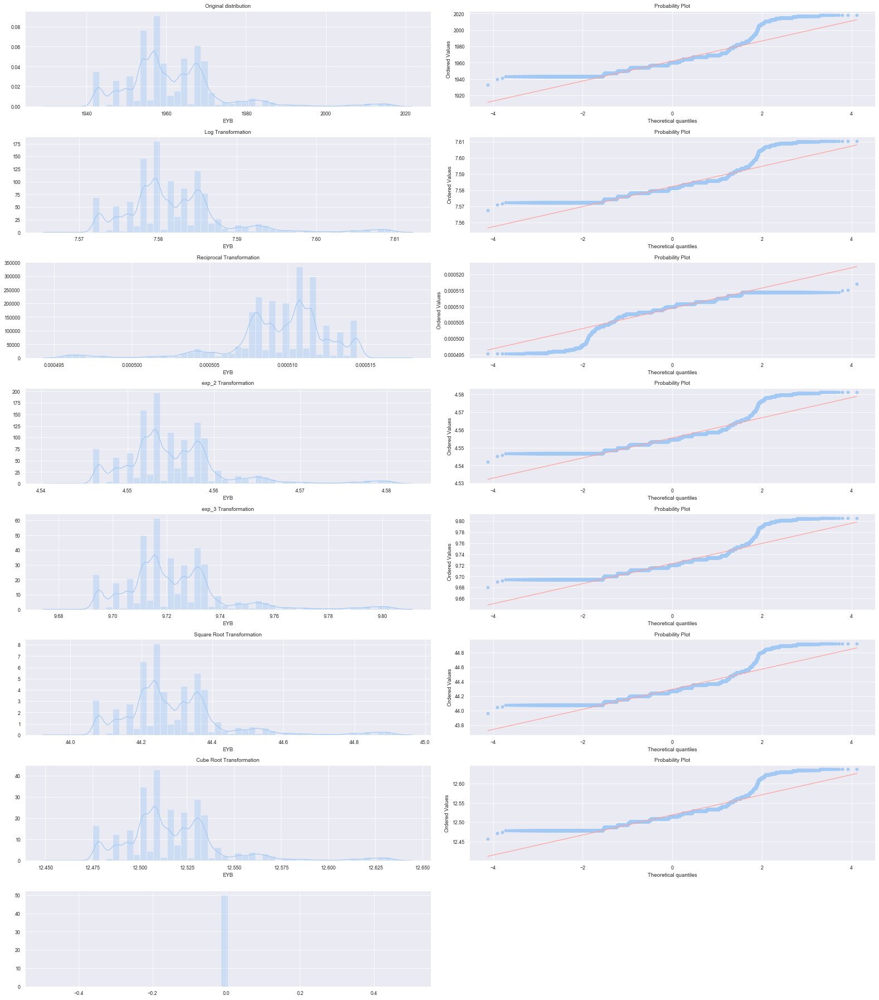

PRICE 

        Transformation      Skew
                Actual  1.769310
                   Log -0.964565
            Reciprocal  0.998568
 Exponential power 0.2 -0.796630
 Exponential power 0.3 -0.572790
           Square Root  0.005082
             Cube Root -0.485667
                Boxcox -0.757239

 Best Transformation for  PRICE : 
 Square Root = 0.005081619947173007


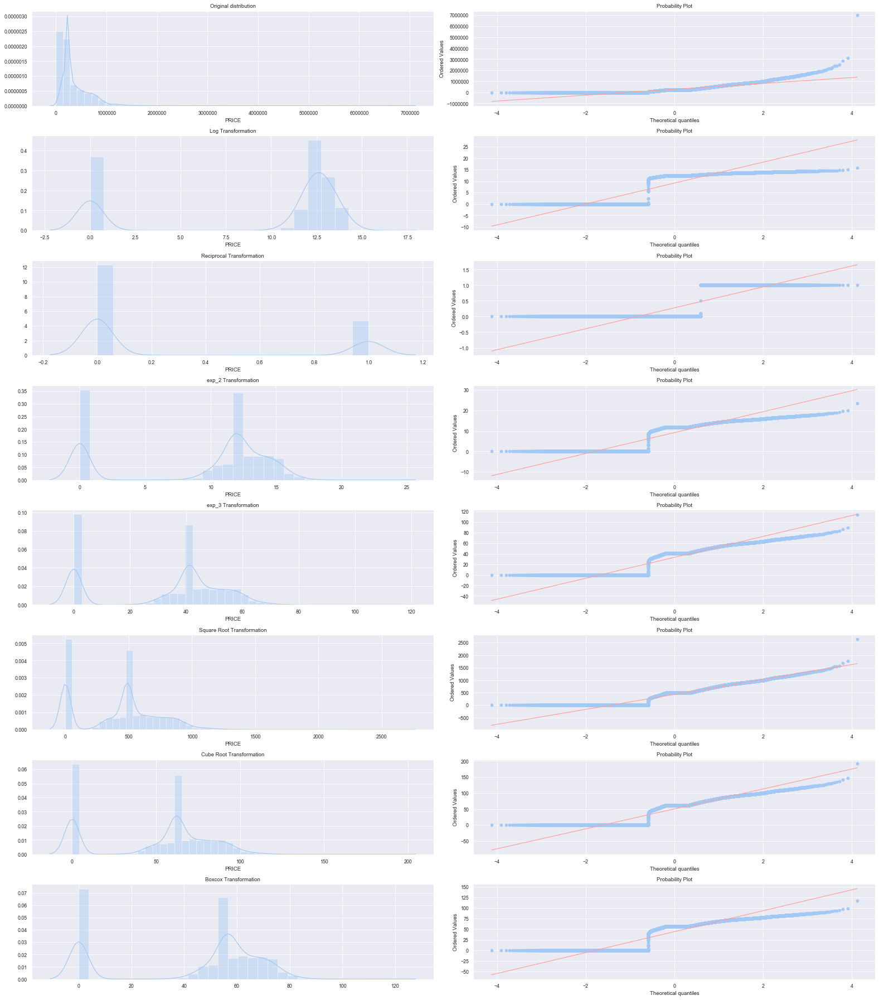

GBA 

        Transformation      Skew
                Actual  1.495721
                   Log  0.398677
            Reciprocal  0.410594
 Exponential power 0.2  0.585315
 Exponential power 0.3  0.683614
           Square Root  0.891266
             Cube Root  0.717154
                Boxcox  0.003812

 Best Transformation for  GBA : 
 Boxcox = 0.003811924687262294


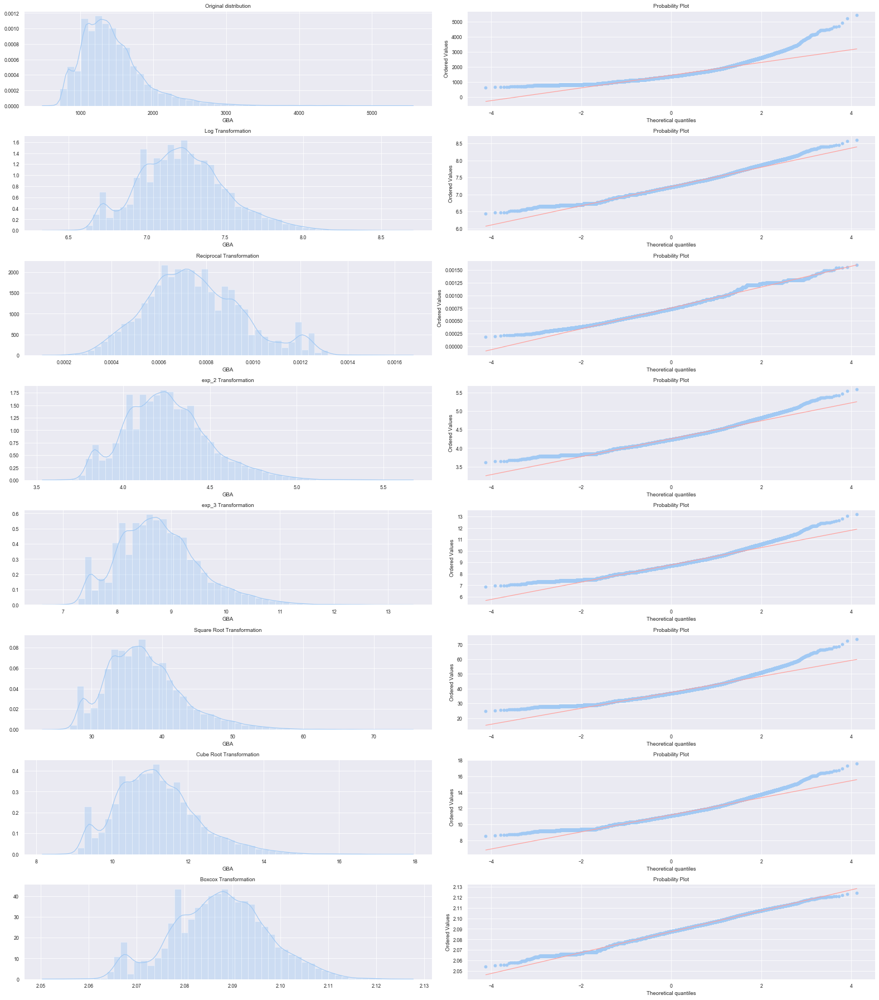

LANDAREA 

        Transformation      Skew
                Actual  3.119580
                   Log  0.522473
            Reciprocal  1.332085
 Exponential power 0.2  0.877866
 Exponential power 0.3  1.068527
           Square Root  1.492809
             Cube Root  1.134740
                Boxcox -0.006590

 Best Transformation for  LANDAREA : 
 Boxcox = -0.0065901517218198945


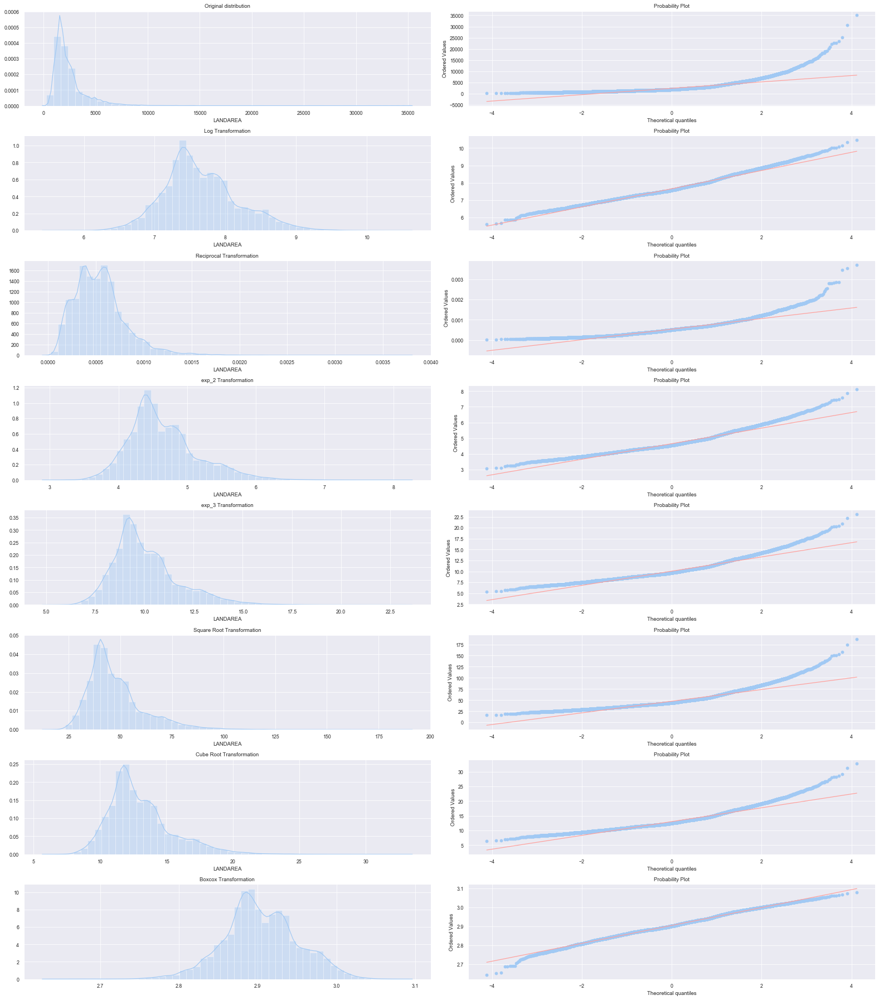

In [430]:
df2 = my_df
for column in num_var:
    print('\033[1m'+column.upper()+'\033[0m','\n')
    plt.figure(figsize=(22,25))
    
    raw_skewness = df2[column].skew()
    
    plt.subplot(8,2,1)
    sns.distplot(df2[column])
    plt.title('Original distribution')
    
    plt.subplot(8,2,2)
    st.probplot(df2[column],dist='norm',plot=plt)
    
    
    #log transformation
    log_transform = np.log(df2[column]+1)
    log_skew=log_transform.skew()
    
    plt.subplot(8,2,3)
    sns.distplot(log_transform)
    plt.title('Log Transformation')
    
    plt.subplot(8,2,4)
    st.probplot(log_transform,dist='norm',plot=plt)
    
    #Reciprocal Transformation  
    
    recip_transform = 1/(df2[column]+1)
    recip_skew=recip_transform.skew()
    
    plt.subplot(8,2,5)
    sns.distplot(recip_transform)
    plt.title('Reciprocal Transformation')
    
    plt.subplot(8,2,6)
    st.probplot(recip_transform,dist='norm',plot=plt)
    
    #Exponential Transformation
    
    exp_2 = df2[column]**0.2
    exp_2_skew=exp_2.skew()
    
    plt.subplot(8,2,7)
    sns.distplot(exp_2)
    plt.title('exp_2 Transformation')
    
    plt.subplot(8,2,8)
    st.probplot(exp_2,dist='norm',plot=plt)
    
    exp_3 = df2[column]**0.3
    exp_3_skew=exp_3.skew()
    
    plt.subplot(8,2,9)
    sns.distplot(exp_3)
    plt.title('exp_3 Transformation')
    
    plt.subplot(8,2,10)
    st.probplot(exp_3,dist='norm',plot=plt)
    
    #Square Root Transformation
    
    sqrt_transform = df2[column]**(1/2)
    sqrt_transform_skew=sqrt_transform.skew()
    
    plt.subplot(8,2,11)
    sns.distplot(sqrt_transform)
    plt.title('Square Root Transformation')
    
    plt.subplot(8,2,12)
    st.probplot(sqrt_transform,dist='norm',plot=plt)
    
    #Cube Root Transformation
    
    cube_transform = df2[column]**(1/3)
    cube_transform_skew=cube_transform.skew()
    
    plt.subplot(8,2,13)
    sns.distplot(cube_transform)
    plt.title('Cube Root Transformation')
    
    plt.subplot(8,2,14)
    st.probplot(cube_transform,dist='norm',plot=plt)
    
    #Boxcox Transformation
    
    box,param = st.boxcox(df2[column]+1)
    boxcox_skew=pd.DataFrame(box).skew()
    
    plt.subplot(8,2,15)
    plt.tight_layout()
    try:
        sns.distplot(pd.DataFrame(box))
        plt.title('Boxcox Transformation')

        plt.subplot(8,2,16)
        st.probplot(box,dist='norm',plot=plt)
    except:
        None
    
    trans_result= {'Actual':raw_skewness, 'Log':log_skew,'Reciprocal':recip_skew,'Exponential power 0.2':exp_2_skew,
                       'Exponential power 0.3':exp_3_skew,'Square Root':sqrt_transform_skew,
                       'Cube Root':cube_transform_skew,'Boxcox':boxcox_skew[0]}
    print(pd.DataFrame(trans_result.items(), columns=['Transformation', 'Skew']).to_string(index=False))
    
    lst=list(trans_result.values())
    idx = min((abs(x), x) for x in lst)[1]
    for i in trans_result:
        if (trans_result[i]==idx):
            print('\n','Best Transformation for ',column,':','\n',i,'=',trans_result[i])
    plt.tight_layout() 
    
    plt.show()

In [64]:
transform = my_df

In [65]:
transform['PRICE'] = transform['PRICE'] ** (1/2)
transform['GBA'],l = st.boxcox(transform['GBA'] + 1)
transform['LANDAREA'],m = st.boxcox(transform['LANDAREA'] + 1)

#### After Transformation:

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000025271F462C8>,
      dtype=object)

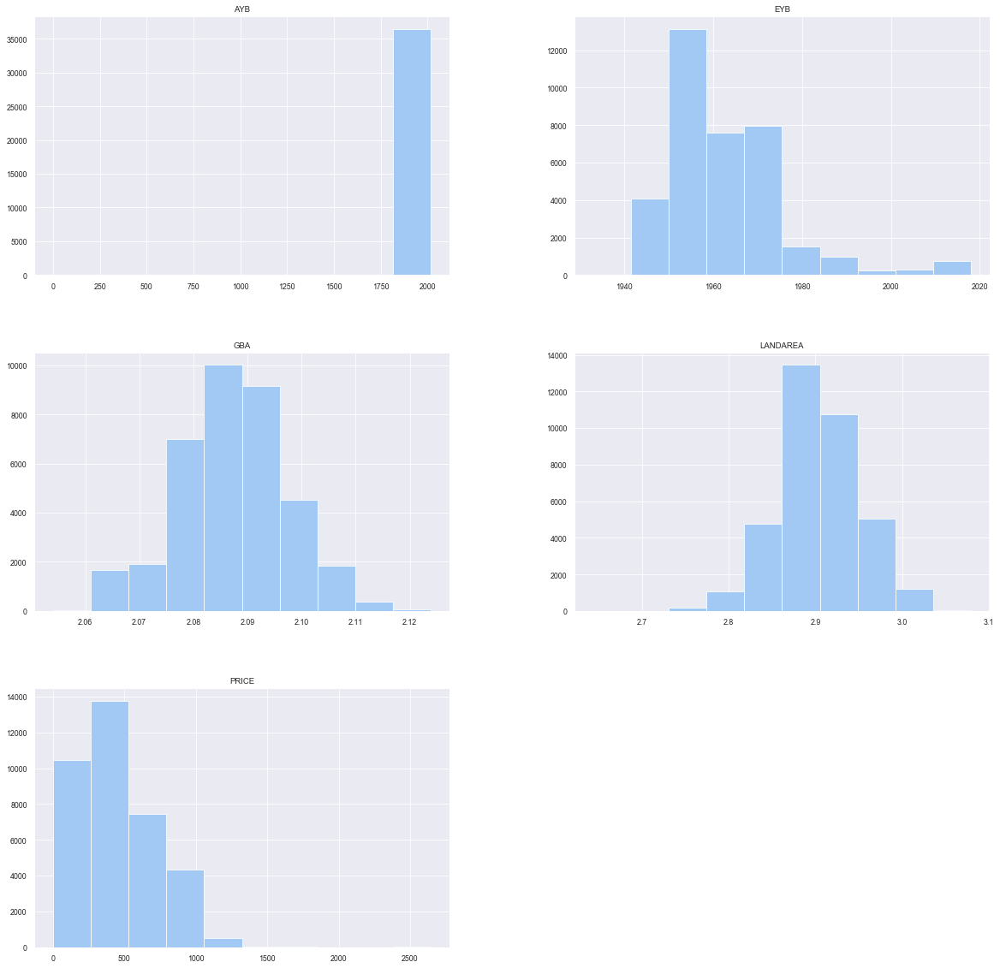

In [497]:
transform.hist(column = num_var , figsize=(20,20))

#### From the above plots, most of the features were brought to normal distribution.

In [66]:
X = transform.drop(['QUALIFIED'], axis=1)
#X = X[cols[1:]]
y = transform['QUALIFIED']

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, stratify=y, random_state=42)

Accuracy: 0.8699854121079504

              precision    recall  f1-score   support

           0       0.89      0.88      0.89      6360
           1       0.84      0.85      0.85      4608

    accuracy                           0.87     10968
   macro avg       0.87      0.87      0.87     10968
weighted avg       0.87      0.87      0.87     10968


Average 5-Fold CV Score: 0.8653 , Standard deviation: 0.0344


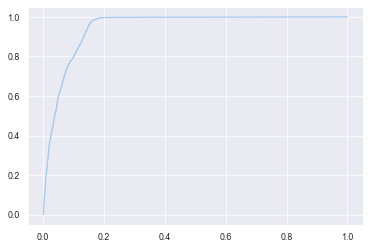

In [67]:
LR = LogisticRegression(random_state=0)
LR.fit(X_train, y_train)
y_pred = LR.predict(X_test)
print('Accuracy:', accuracy_score(y_pred,y_test))

cv_scores = cross_val_score(LR, X, y, cv=5)
print()
print(classification_report(y_test, y_pred))
print()
print("Average 5-Fold CV Score: {}".format(round(np.mean(cv_scores),4)),
      ", Standard deviation: {}".format(round(np.std(cv_scores),4)))
y_test_prob = LR.predict_proba(X_test)[:,1]
fpr,tpr,thresholds = roc_curve(y_test,y_test_prob)
plt.plot(fpr,tpr)

#### The Accuracy improved to 0.87

### iii) Multicollinearity:

#### Multicollinearity refers to a situation in which two or more explanatory variables in a multiple regression model are highly linearly related. It can decrease the performance of the model. Hence, there is a need to remove features that are correlated with each other.

In [70]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

X_data = transform.drop(['QUALIFIED'], axis=1)
X_data = X_data.astype("int")

calc_vif(X_data)

,variables,VIF
0,BATHRM,1.985685
1,HF_BATHRM,1.228451
2,HEAT,1.535675
3,AC,1.712837
4,NUM_UNITS,7.273954
5,ROOMS,1.657333
6,BEDRM,1.646270
7,AYB,1.040953
8,YR_RMDL,3.613708
9,EYB,2.379617


### Setting a threshold of 5 and removing any higher than those. So I will be dropping [STYLE,STORIES,NUM_UNITS]

In [71]:
def calculate_vif(x):
    thresh = 5.0
    output = pd.DataFrame()
    k = x.shape[1]
    vif = [variance_inflation_factor(x.values, j) for j in range(x.shape[1])]
    for i in range(1,k):
        print("Iteration no.")
        print(i)
        print(vif)
        a = np.argmax(vif)
        print("Max VIF is for variable no.:")
        print(a)
        if vif[a] <= thresh :
            break
        if i == 1 :          
            output = x.drop(x.columns[a], axis = 1)
            vif = [variance_inflation_factor(output.values, j) for j in range(output.shape[1])]
        elif i > 1 :
            output = output.drop(output.columns[a],axis = 1)
            vif = [variance_inflation_factor(output.values, j) for j in range(output.shape[1])]
    return(output)

In [72]:
multi = calculate_vif(X_data)

Iteration no.
1
[1.9856849998313633, 1.228451038020466, 1.5356746547348528, 1.7128368874652105, 7.27395432715984, 1.6573333722842976, 1.646269980789678, 1.0409531265411565, 3.6137083499770215, 2.379617277009904, 11.244182310718974, 1.296656354923055, 1.2107654770817577, 0.0, 0.0, 11.155916515305139, 1.5200597501330222, 1.7773160938468107, 1.8314773736876044, 1.274067834474385, 1.2869968353198153, 1.1111439708233142, 4.559253360664859, 1.5509035293668103, 4.419653474117536, 1.1465948052934725, 3.7126562478258447]
Max VIF is for variable no.:
10
Iteration no.
2
[1.9855800268580277, 1.228078518855776, 1.5356714163230936, 1.7124390281152275, 7.273516903201506, 1.6558850070163118, 1.6459009333626573, 1.0409015500904955, 3.613625365509029, 2.368481078349981, 1.296373721732776, 1.2107647344704233, 0.0, 0.0, 1.1877850579197222, 1.5174122323635835, 1.774980559278081, 1.831431075466508, 1.2715679016731598, 1.2860477670153823, 1.108912691604519, 4.559110679919599, 1.5486243194796165, 4.4192416486

In [73]:
X = multi
#X = X[cols[1:]]
y = transform['QUALIFIED']

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, stratify=y, random_state=42)

Accuracy: 0.8694383661560905

              precision    recall  f1-score   support

           0       0.89      0.88      0.89      6360
           1       0.84      0.85      0.85      4608

    accuracy                           0.87     10968
   macro avg       0.87      0.87      0.87     10968
weighted avg       0.87      0.87      0.87     10968


Average 5-Fold CV Score: 0.8676 , Standard deviation: 0.0312


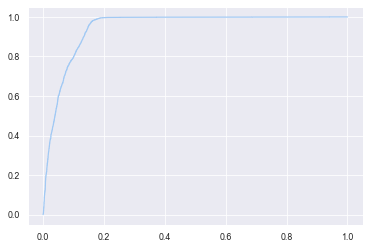

In [74]:
LR = LogisticRegression(random_state=0)
LR.fit(X_train, y_train)
y_pred = LR.predict(X_test)
print('Accuracy:', accuracy_score(y_pred,y_test))

cv_scores = cross_val_score(LR, X, y, cv=5)
print()
print(classification_report(y_test, y_pred))
print()
print("Average 5-Fold CV Score: {}".format(round(np.mean(cv_scores),4)),
      ", Standard deviation: {}".format(round(np.std(cv_scores),4)))
y_test_prob = LR.predict_proba(X_test)[:,1]
fpr,tpr,thresholds = roc_curve(y_test,y_test_prob)
plt.plot(fpr,tpr)

#### The Accuracy has remained the same but the Cross-Validation Accuracy Score has improved

### iv) Re-Sampling Techniques:

In [75]:
X = multi
#X = X[cols[1:]]
y = transform['QUALIFIED']

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, stratify=y, random_state=42)

In [76]:
# create the training df by remerging X_train and y_train
df_train = X_train.join(y_train)
df_train.head()

,BATHRM,HF_BATHRM,HEAT,AC,ROOMS,BEDRM,AYB,YR_RMDL,EYB,PRICE,SALE_NUM,GBA,BLDG_NUM,STYLE,STRUCT,GRADE,CNDTN,EXTWALL,ROOF,INTWALL,KITCHENS,FIREPLACES,USECODE,LANDAREA,SALEYEAR,QUALIFIED
53709,2,0,13,0,7,3,1942,1900,1957,487,1,2,1,4,1,4,3,14,1,6,1,1,12,2,1900,0
6122,2,1,1,1,6,3,1895,1962,1960,0,1,2,1,4,7,5,4,14,6,6,1,2,11,2,1998,0
11535,3,0,1,1,8,3,1919,2001,1967,866,2,2,1,4,7,4,5,14,6,3,1,1,11,2,2016,1
47465,1,2,1,1,6,3,1951,2014,1961,547,2,2,1,4,8,3,3,14,2,6,1,0,13,2,2014,1
63651,1,1,13,0,7,3,1939,2009,1947,0,1,2,1,4,1,4,3,14,1,6,1,1,12,3,2009,0


##### We have observed that there is imbalance in the samples. Let's see the distribution of the samples in the train dataset

In [77]:
# Separate majority and minority classes
df_majority = df_train[df_train.QUALIFIED == 0]
df_minority = df_train[df_train.QUALIFIED == 1]

print(df_majority.QUALIFIED.count())
print("-----------")
print(df_minority.QUALIFIED.count())
print("-----------")
print(df_train.QUALIFIED.value_counts())

14841
-----------
10751
-----------
0    14841
1    10751
Name: QUALIFIED, dtype: int64


#### There's a lot of imbalance in the sample. So there are many ways to resampling!

#### Resampling involves creating a new transformed version of the training dataset in which the selected examples have a different class distribution. This is a simple and effective strategy for imbalanced classification problems.

#### The simplest strategy is to choose examples for the transformed dataset randomly, called random resampling. There are two main approaches to random resampling for imbalanced classification; they are oversampling and undersampling.

#### A) Random Oversampling: Randomly duplicate examples in the minority class.
#### B) Random Undersampling: Randomly delete examples in the majority class.
#### C) SMOTE: Synthetic Minority Oversampling Technique

#### Let's look at them, one by one


### A) Random Oversampling:

#### Random oversampling involves randomly duplicating examples from the minority class and adding them to the training dataset.

#### Examples from the training dataset are selected randomly with replacement. This means that examples from the minority class can be chosen and added to the new “more balanced” training dataset multiple times; they are selected from the original training dataset, added to the new training dataset, and then returned or “replaced” in the original dataset, allowing them to be selected again.

In [78]:
# Upsample minority class
df_minority_upsampled = resample(df_minority, 
                                 replace=True,     # sample with replacement
                                 n_samples = 14841,    # to match majority class
                                 random_state= 42) # reproducible results
# Combine majority class with upsampled minority class
df_upsampled = pd.concat([df_majority, df_minority_upsampled])
# Display new class counts
df_upsampled.QUALIFIED.value_counts()

1    14841
0    14841
Name: QUALIFIED, dtype: int64

### B) Random Undersampling:

#### Random undersampling involves randomly selecting examples from the majority class to delete from the training dataset.

#### This has the effect of reducing the number of examples in the majority class in the transformed version of the training dataset. This process can be repeated until the desired class distribution is achieved, such as an equal number of examples for each class.

#### This approach may be more suitable for those datasets where there is a class imbalance although a sufficient number of examples in the minority class, such a useful model can be fit.

In [79]:
# Downsample majority class
df_majority_downsampled = resample(df_majority, 
                                 replace=False,    # sample without replacement
                                 n_samples=10751,     # to match minority class
                                 random_state=587) # reproducible results
# Combine minority class with downsampled majority class
df_downsampled = pd.concat([df_majority_downsampled, df_minority])
# Display new class counts
df_downsampled.QUALIFIED.value_counts()

1    10751
0    10751
Name: QUALIFIED, dtype: int64

### C) SMOTE: Synthetic Minority Oversampling Technique

#### The upsample has the disadvantage of increasing the likelihood of overfitting since it replicates the minority class event. It usually outperform the downsampling. The downsample can discard potentially useful information and the sample can be biased, but it helps improving the run time

#### SMOTE works by selecting examples that are close in the feature space, drawing a line between the examples in the feature space and drawing a new sample at a point along that line. To create a syntetic sample I want to use the SMOTE algorithm, which is an oversampling method which creates syntetic samples from the minority class instead of creating copies. It selects 2 or more similar instances and perturb them one at a time by random amount. This techniques should avoid overfitting problems but it risks adding noise to the model

In [80]:
sm = SMOTE(random_state=42)
X_SMOTE, y_SMOTE = sm.fit_sample(X_train, y_train)
print(len(y_SMOTE))
print(y_SMOTE.sum())

29682
14841


#### So we have 4 sets of training data:

#### 1) The normal train data with unbalance
#### 2) Train data with oversampling
#### 3) Train data with undersampling
#### 4) Train data with SMOTE algorithm

#### The evaluation will be based on K fold cross validation of AUC (Area Under The Curve) ROC (Receiver Operating Characteristics) curve score which is considered as the best metric for binary classification and also the test score

#### AUC - ROC curve is a performance measurement for classification problem at various thresholds settings. ROC is a probability curve and AUC represents degree or measure of separability. It tells how much model is capable of distinguishing between classes. Higher the AUC, better the model is at predicting 0s as 0s and 1s as 1s. By analogy, Higher the AUC, better the model is at distinguishing between patients with disease and no disease. The ROC curve is plotted with TPR against the FPR where TPR is on y-axis and FPR is on the x-axis.

#### First let's define a function which evaluates the model with train and test score and also performs a K-fold cross validation on the train dataset

In [81]:
def model_eval(algo, Xtrain,ytrain,Xtest,ytest):
    from sklearn.metrics import confusion_matrix,accuracy_score,roc_auc_score,roc_curve,classification_report

    algo.fit(Xtrain,ytrain)
    y_pred = algo.predict(Xtrain)
    y_train_prob = algo.predict_proba(Xtrain)[:,1]

    #print('confusion matrix-train\n',confusion_matrix(ytrain,y_pred))
    print('Overall Train Accuracy',accuracy_score(ytrain,y_pred))
    print('Train AUC Score',roc_auc_score(ytrain,y_train_prob))

    y_test_pred = algo.predict(Xtest)
    y_test_prob = algo.predict_proba(Xtest)[:,1]


    #print('confusion matrix-test\n',confusion_matrix(ytest,y_test_pred))
    print('Overall Test Accuracy',accuracy_score(ytest,y_test_pred))
    print('Test AUC Score',roc_auc_score(ytest,y_test_prob))
    print('Classification Report of Test\n',  classification_report(ytest, y_test_pred))
    
    
    kf = KFold(n_splits = 5,shuffle = True,random_state = 42)
    score=[]
    for train_idx,test_idx in kf.split(Xtrain,ytrain):
        xtrain_k,xtest_k = Xtrain.iloc[train_idx,:],Xtrain.iloc[test_idx,:]
        ytrain_k,ytest_k = ytrain.iloc[train_idx],ytrain.iloc[test_idx]
        algo.fit(xtrain_k,ytrain_k)
        y_pred_k = algo.predict(xtest_k)
        roc = roc_auc_score(ytest_k,y_pred_k)
        score.append(roc)
    print('K-Fold scores: %0.03f (+/- %0.5f)' % (np.mean(score),np.var(score,ddof=1)))
    
    f,ax =  plt.subplots(1,2,figsize=(14,6))
    #plt.figure(figsize=(6,4))
    ConfMatrix = confusion_matrix(ytest,y_test_pred)
    sns.heatmap(ConfMatrix,annot=True, cmap="Greens", fmt="d", 
            xticklabels = ['Not-Qualified', 'Qualified'], 
            yticklabels = ['Not-Qualified', 'Qualified'],linewidths=.5,ax = ax[0])
    ax[0].set_ylabel('True label')
    ax[0].set_xlabel('Predicted label')
    ax[0].set_title('Confusion Matrix')

    global fpr,tpr,thresholds
    fpr,tpr,thresholds = roc_curve(ytest,y_test_prob)
    ax[1].plot(fpr,tpr,color = 'r')
    ax[1].plot(fpr,fpr,color = 'green')
    ax[1].set_ylabel('TPR')
    ax[1].set_xlabel('FPR')
    ax[1].set_title('ROC Curve')
    plt.show()

# 5) Model Building:

#### I will be using the following algorithms with the 4 different datasets and also with hyperparameter tuning the models

### i) Logistic Regression
### ii) Naive Bayes
### iii) K-Nearest Neighbours
### iv) Decision Tree
### v) Random Forest
### vi) AdaBoost Classifier
### vii) GradientBoosting Classifier
### viii) XGBoost Classifier

### i) Logistic Regression:

#### Let's first find out the best parameters for all the datasets:

In [537]:
xtrain_data = [X_train,df_upsampled.drop('QUALIFIED',axis = 1),df_downsampled.drop('QUALIFIED',axis = 1),X_SMOTE]
ytrain_data = [y_train,df_upsampled['QUALIFIED'],df_downsampled['QUALIFIED'],y_SMOTE]
name = ['Normal Sampling' , 'Over Sampling' , 'Under Sampling' , 'SMOTE']
param_log =[]
for i,j,k in zip(xtrain_data,ytrain_data,name):
    global best_log
    print('Data is ',k)
    best_log = []
    # Setup the hyperparameter grid, (not scaled data)
    param_grid = {'C': np.logspace(-5, 8, 15)}
    # Instantiate a logistic regression classifier
    logreg = LogisticRegression()
    # Instantiate the RandomizedSearchCV object
    logreg_cv = RandomizedSearchCV(logreg, param_grid ,scoring = 'roc_auc', cv=5, random_state=0)
    # Fit it to the data
    logreg_cv.fit(i,j)
    best_log.append(logreg_cv.best_params_)
    # Print the tuned parameters and score
    print("Tuned Logistic Regression Parameters: {}".format(logreg_cv.best_params_))
    param_log.append(logreg_cv.best_params_)
    print("_" * 100)

Data is  Normal Sampling
Tuned Logistic Regression Parameters: {'C': 19306.977288832535}
____________________________________________________________________________________________________
Data is  Over Sampling
Tuned Logistic Regression Parameters: {'C': 19306.977288832535}
____________________________________________________________________________________________________
Data is  Under Sampling
Tuned Logistic Regression Parameters: {'C': 19306.977288832535}
____________________________________________________________________________________________________
Data is  SMOTE
Tuned Logistic Regression Parameters: {'C': 2275.845926074791}
____________________________________________________________________________________________________


In [538]:
param_log

[{'C': 19306.977288832535},
 {'C': 19306.977288832535},
 {'C': 19306.977288832535},
 {'C': 2275.845926074791}]

In [532]:
param_log =[{'C': 19306.977288832535},{'C': 19306.977288832535},{'C': 19306.977288832535},{'C': 2275.845926074791}]

Data is  Normal Sampling  And with hyper parameter  {'C': 19306.977288832535}
Overall Train Accuracy 0.869959362300719
Train AUC Score 0.9448092169957241
Overall Test Accuracy 0.8689824945295405
Test AUC Score 0.9456639874323025
Classification Report of Test
               precision    recall  f1-score   support

           0       0.89      0.88      0.89      6360
           1       0.84      0.85      0.85      4608

    accuracy                           0.87     10968
   macro avg       0.87      0.87      0.87     10968
weighted avg       0.87      0.87      0.87     10968

K-Fold scores: 0.869 (+/- 0.00001)


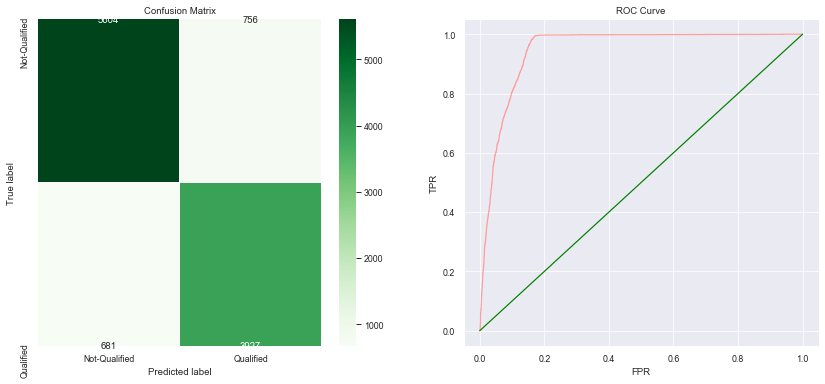

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'C': 19306.977288832535}
Overall Train Accuracy 0.8853513914156728
Train AUC Score 0.9458977421749084
Overall Test Accuracy 0.8790116703136397
Test AUC Score 0.9459552159765898
Classification Report of Test
               precision    recall  f1-score   support

           0       0.92      0.87      0.89      6360
           1       0.83      0.90      0.86      4608

    accuracy                           0.88     10968
   macro avg       0.87      0.88      0.88     10968
weighted avg       0.88      0.88      0.88     10968

K-Fold scores: 0.884 (+/- 0.00004)


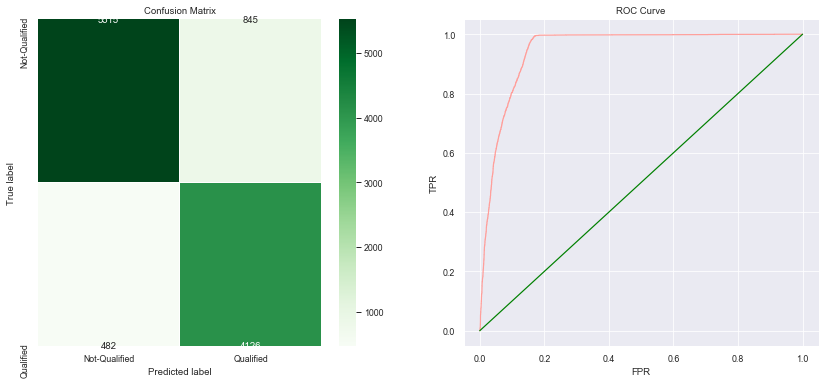

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'C': 19306.977288832535}
Overall Train Accuracy 0.883359687470933
Train AUC Score 0.9444542804847187
Overall Test Accuracy 0.8783734500364697
Test AUC Score 0.945456015788784
Classification Report of Test
               precision    recall  f1-score   support

           0       0.92      0.87      0.89      6360
           1       0.83      0.89      0.86      4608

    accuracy                           0.88     10968
   macro avg       0.87      0.88      0.88     10968
weighted avg       0.88      0.88      0.88     10968

K-Fold scores: 0.883 (+/- 0.00002)


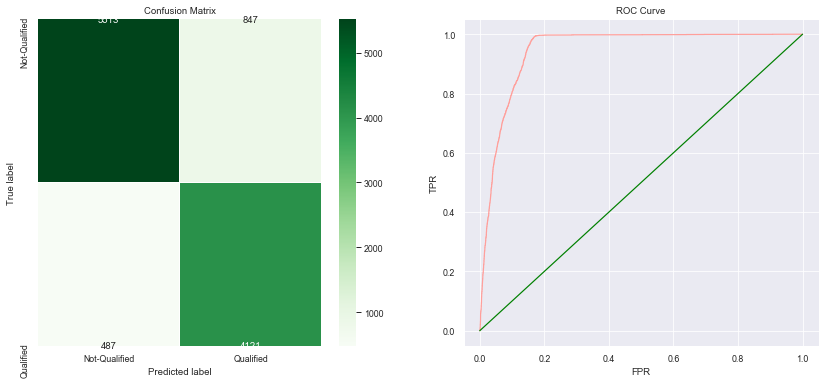

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'C': 2275.845926074791}
Overall Train Accuracy 0.8846438919210295
Train AUC Score 0.945108993777089
Overall Test Accuracy 0.8784646243617797
Test AUC Score 0.9452322116854472
Classification Report of Test
               precision    recall  f1-score   support

           0       0.92      0.87      0.89      6360
           1       0.83      0.89      0.86      4608

    accuracy                           0.88     10968
   macro avg       0.87      0.88      0.88     10968
weighted avg       0.88      0.88      0.88     10968

K-Fold scores: 0.885 (+/- 0.00003)


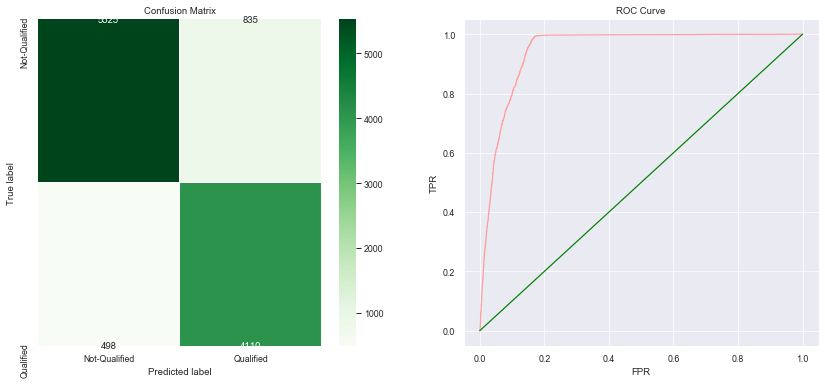

____________________________________________________________


In [539]:
xtrain_data = [X_train,df_upsampled.drop('QUALIFIED',axis = 1),df_downsampled.drop('QUALIFIED',axis = 1),X_SMOTE]
ytrain_data = [y_train,df_upsampled['QUALIFIED'],df_downsampled['QUALIFIED'],y_SMOTE]
name = ['Normal Sampling' , 'Over Sampling' , 'Under Sampling' , 'SMOTE']
index = [0,1,2,3]

for i,j,k,l in zip(xtrain_data,ytrain_data,name,index):
    print('Data is ',k,' And with hyper parameter ',param_log[l])
    model_eval(LogisticRegression(**param_log[l],random_state= 42), i,j,X_test,y_test)
    print("_" * 60)

#### The best score for Logistic Regression is seen in SMOTE data with an K-fold Accuracy score of 0.88

### ii) Naive bayes:

Data is  Normal Sampling
Overall Train Accuracy 0.8046264457643013
Train AUC Score 0.8876566067810184
Overall Test Accuracy 0.8011487964989059
Test AUC Score 0.8840955604963748
Classification Report of Test
               precision    recall  f1-score   support

           0       0.84      0.81      0.83      6360
           1       0.75      0.79      0.77      4608

    accuracy                           0.80     10968
   macro avg       0.80      0.80      0.80     10968
weighted avg       0.80      0.80      0.80     10968

K-Fold scores: 0.803 (+/- 0.00007)


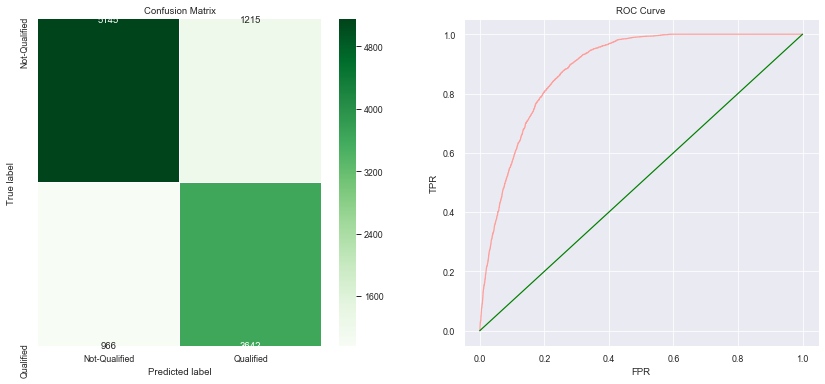

____________________________________________________________
Data is  Over Sampling
Overall Train Accuracy 0.8073916851964154
Train AUC Score 0.8845261172194097
Overall Test Accuracy 0.7987782640408461
Test AUC Score 0.8805498913565688
Classification Report of Test
               precision    recall  f1-score   support

           0       0.86      0.78      0.82      6360
           1       0.73      0.82      0.78      4608

    accuracy                           0.80     10968
   macro avg       0.80      0.80      0.80     10968
weighted avg       0.81      0.80      0.80     10968

K-Fold scores: 0.807 (+/- 0.00007)


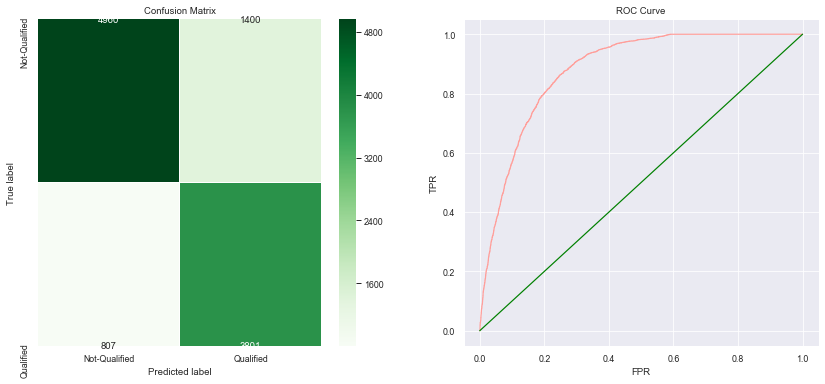

____________________________________________________________
Data is  Under Sampling
Overall Train Accuracy 0.8062970886429169
Train AUC Score 0.8873685121870803
Overall Test Accuracy 0.8012399708242159
Test AUC Score 0.8834782481110237
Classification Report of Test
               precision    recall  f1-score   support

           0       0.85      0.79      0.82      6360
           1       0.74      0.81      0.77      4608

    accuracy                           0.80     10968
   macro avg       0.80      0.80      0.80     10968
weighted avg       0.81      0.80      0.80     10968

K-Fold scores: 0.806 (+/- 0.00001)


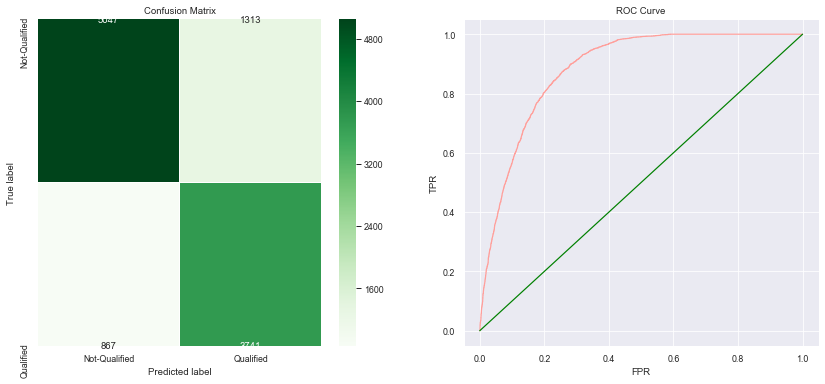

____________________________________________________________
Data is  SMOTE
Overall Train Accuracy 0.8104912067919952
Train AUC Score 0.8871236190700008
Overall Test Accuracy 0.8090809628008753
Test AUC Score 0.8879341642645002
Classification Report of Test
               precision    recall  f1-score   support

           0       0.88      0.78      0.83      6360
           1       0.74      0.85      0.79      4608

    accuracy                           0.81     10968
   macro avg       0.81      0.81      0.81     10968
weighted avg       0.82      0.81      0.81     10968

K-Fold scores: 0.810 (+/- 0.00008)


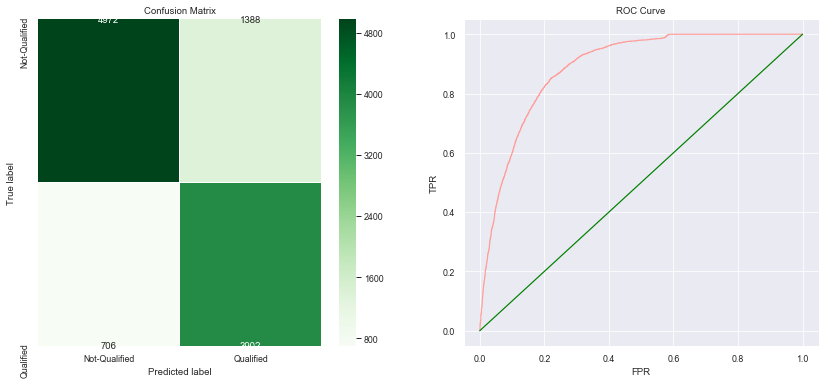

____________________________________________________________


In [535]:
xtrain_data = [X_train,df_upsampled.drop('QUALIFIED',axis = 1),df_downsampled.drop('QUALIFIED',axis = 1),X_SMOTE]
ytrain_data = [y_train,df_upsampled['QUALIFIED'],df_downsampled['QUALIFIED'],y_SMOTE]
name = ['Normal Sampling' , 'Over Sampling' , 'Under Sampling' , 'SMOTE']

for i,j,k in zip(xtrain_data,ytrain_data,name):
    print('Data is ',k)
    ss = StandardScaler()
    a = ss.fit_transform(i)
    xts = pd.DataFrame(a,columns = i.columns)
    b = ss.transform(X_test)
    model_eval(GaussianNB(), xts,j,b,y_test)
    print("_" * 60)

#### The best score for Naive Bayes is registered when trained with the SMOTE data with an Test AUC score of 0.88 and train K-Fold score of 0.81 after it was standardized

### iii) K-Nearest Neighbours: 

#### Let's first find out the best parameters for all the datasets:

#### It's always recommended to scale the data before using distance based algorithm to make the model not biased

In [540]:
xtrain_data = [X_train,df_upsampled.drop('QUALIFIED',axis = 1),df_downsampled.drop('QUALIFIED',axis = 1),X_SMOTE]
ytrain_data = [y_train,df_upsampled['QUALIFIED'],df_downsampled['QUALIFIED'],y_SMOTE]
name = ['Normal Sampling' , 'Over Sampling' , 'Under Sampling' , 'SMOTE']
param_knn = []
for i,j,k in zip(xtrain_data,ytrain_data,name):
    global best_xgb
    ss = StandardScaler()
    a = ss.fit_transform(i)
    xts = pd.DataFrame(a,columns = i.columns)
    best_knn = []
    print('Data is ',k) # Instantiate a KNN classifier: tree
    knn = KNeighborsClassifier()
    # Setup the parameters and distributions to sample from: param_dist
    params = {'n_neighbors' : sp_randint(1,20),
             'p': sp_randint(1,5)}
    rsearch_knn = RandomizedSearchCV(knn, param_distributions = params, cv = 3, random_state = 3 , n_iter = 50,n_jobs = -1)
    rsearch_knn.fit(xts,j)
    best_knn.append(rsearch_knn.best_params_)
    print("Tuned KNN Parameters: {}".format(rsearch_knn.best_params_), "for",k)
    param_knn.append(rsearch_knn.best_params_)
    print("_" * 100)

Data is  Normal Sampling
Tuned KNN Parameters: {'n_neighbors': 15, 'p': 2} for Normal Sampling
____________________________________________________________________________________________________
Data is  Over Sampling
Tuned KNN Parameters: {'n_neighbors': 13, 'p': 2} for Over Sampling
____________________________________________________________________________________________________
Data is  Under Sampling
Tuned KNN Parameters: {'n_neighbors': 15, 'p': 2} for Under Sampling
____________________________________________________________________________________________________
Data is  SMOTE
Tuned KNN Parameters: {'n_neighbors': 17, 'p': 1} for SMOTE
____________________________________________________________________________________________________


In [83]:
param_knn = [{'n_neighbors': 15, 'p': 2},{'n_neighbors': 13, 'p': 2},{'n_neighbors': 15, 'p': 2},{'n_neighbors': 17, 'p': 1}]

Data is  Normal Sampling  And with hyper parameter  {'n_neighbors': 15, 'p': 2}
Overall Train Accuracy 0.896530165676774
Train AUC Score 0.9602200527087765
Overall Test Accuracy 0.8847556528081693
Test AUC Score 0.9417613202087701
Classification Report of Test
               precision    recall  f1-score   support

           0       0.95      0.85      0.90      6360
           1       0.82      0.93      0.87      4608

    accuracy                           0.88     10968
   macro avg       0.88      0.89      0.88     10968
weighted avg       0.89      0.88      0.89     10968

K-Fold scores: 0.887 (+/- 0.00001)


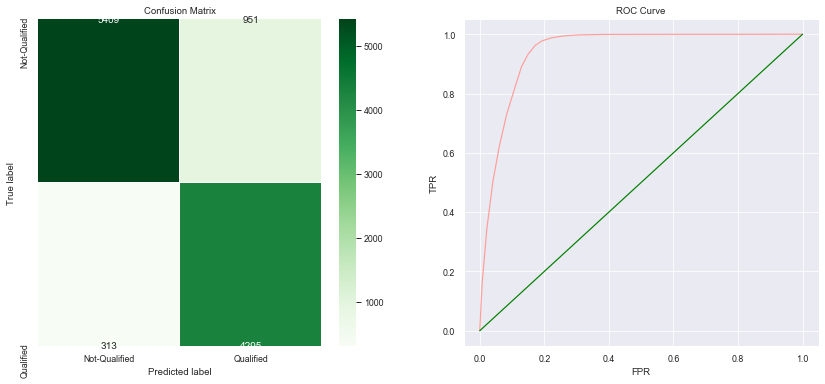

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'n_neighbors': 13, 'p': 2}
Overall Train Accuracy 0.9086314938346473
Train AUC Score 0.9661412567901152
Overall Test Accuracy 0.8827498176513494
Test AUC Score 0.9375356571562719
Classification Report of Test
               precision    recall  f1-score   support

           0       0.96      0.83      0.89      6360
           1       0.80      0.96      0.87      4608

    accuracy                           0.88     10968
   macro avg       0.88      0.89      0.88     10968
weighted avg       0.90      0.88      0.88     10968

K-Fold scores: 0.896 (+/- 0.00001)


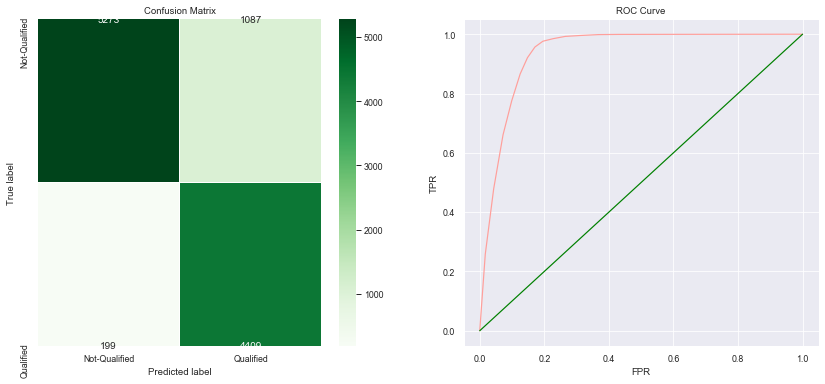

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'n_neighbors': 15, 'p': 2}
Overall Train Accuracy 0.9045670170216724
Train AUC Score 0.9609651901563782
Overall Test Accuracy 0.8817469000729394
Test AUC Score 0.9402364052399983
Classification Report of Test
               precision    recall  f1-score   support

           0       0.97      0.82      0.89      6360
           1       0.80      0.96      0.87      4608

    accuracy                           0.88     10968
   macro avg       0.88      0.89      0.88     10968
weighted avg       0.90      0.88      0.88     10968

K-Fold scores: 0.891 (+/- 0.00001)


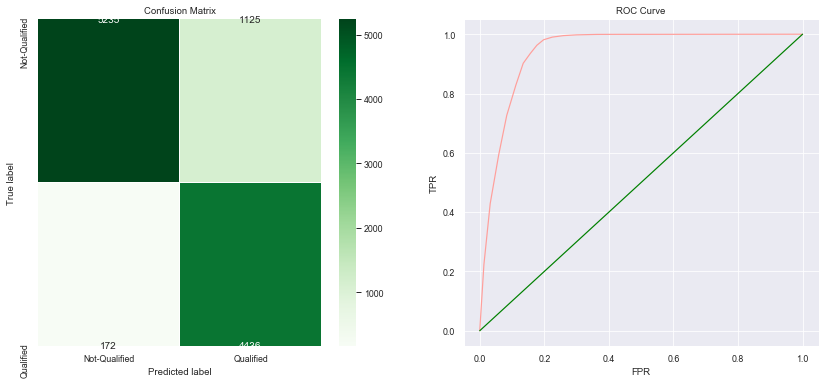

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'n_neighbors': 17, 'p': 1}
Overall Train Accuracy 0.9081261370527592
Train AUC Score 0.9651436030721098
Overall Test Accuracy 0.8836615609044494
Test AUC Score 0.9432047867258473
Classification Report of Test
               precision    recall  f1-score   support

           0       0.97      0.83      0.89      6360
           1       0.80      0.96      0.87      4608

    accuracy                           0.88     10968
   macro avg       0.88      0.89      0.88     10968
weighted avg       0.90      0.88      0.88     10968

K-Fold scores: 0.898 (+/- 0.00001)


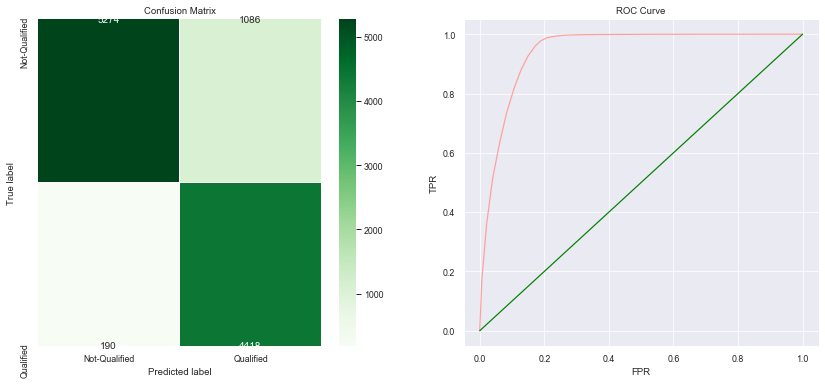

____________________________________________________________


In [84]:
xtrain_data = [X_train,df_upsampled.drop('QUALIFIED',axis = 1),df_downsampled.drop('QUALIFIED',axis = 1),X_SMOTE]
ytrain_data = [y_train,df_upsampled['QUALIFIED'],df_downsampled['QUALIFIED'],y_SMOTE]
name = ['Normal Sampling' , 'Over Sampling' , 'Under Sampling' , 'SMOTE']
index = [0,1,2,3]

for i,j,k,l in zip(xtrain_data,ytrain_data,name,index):
    print('Data is ',k,' And with hyper parameter ',param_knn[l])
    ss = StandardScaler()
    a = ss.fit_transform(i)
    xts = pd.DataFrame(a,columns = i.columns)
    b = ss.transform(X_test)
    model_eval(KNeighborsClassifier(**param_knn[l]), xts,j,b,y_test)
    print("_" * 60)

#### The best score for KNN is registered when trained with the under sampling data with an Test AUC score of 0.94 and train K-Fold score of 0.89

### iv) Decision Tree

#### Let's first find out the best parameters for all the datasets:

In [541]:
xtrain_data = [X_train,df_upsampled.drop('QUALIFIED',axis = 1),df_downsampled.drop('QUALIFIED',axis = 1),X_SMOTE]
ytrain_data = [y_train,df_upsampled['QUALIFIED'],df_downsampled['QUALIFIED'],y_SMOTE]
name = ['Normal Sampling' , 'Over Sampling' , 'Under Sampling' , 'SMOTE']
param_dt = []
for i,j,k in zip(xtrain_data,ytrain_data,name):
    print('Data is ',k)
    # Instantiate a Decision Tree classifier: tree
    dtc = DecisionTreeClassifier(random_state = 42)

    # Setup the parameters and distributions to sample from: param_dist
    params = {'max_depth': sp_randint(2,20),
             'min_samples_leaf':sp_randint(1,20),
             'min_samples_split':sp_randint(2,40),
             'criterion':['gini','entropy']}

    # Instantiate the RandomizedSearchCV object: tree_cv
    rsearch_dt = RandomizedSearchCV(dtc, param_distributions= params, cv = 5, scoring = 'roc_auc',n_iter = 100,n_jobs = -1)

    # Fit it to the data
    rsearch_dt.fit(i,j)
    print("Tuned Decision Tree Parameters: {}".format(rsearch_dt.best_params_), "for",name)
    param_dt.append(rsearch_dt.best_params_)
    print("_" * 100)    

Data is  Normal Sampling
Tuned Decision Tree Parameters: {'criterion': 'gini', 'max_depth': 7, 'min_samples_leaf': 16, 'min_samples_split': 24} for ['Normal Sampling', 'Over Sampling', 'Under Sampling', 'SMOTE']
____________________________________________________________________________________________________
Data is  Over Sampling
Tuned Decision Tree Parameters: {'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 19, 'min_samples_split': 30} for ['Normal Sampling', 'Over Sampling', 'Under Sampling', 'SMOTE']
____________________________________________________________________________________________________
Data is  Under Sampling
Tuned Decision Tree Parameters: {'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 16, 'min_samples_split': 20} for ['Normal Sampling', 'Over Sampling', 'Under Sampling', 'SMOTE']
____________________________________________________________________________________________________
Data is  SMOTE
Tuned Decision Tree Parameters: {'criterion': 'gi

In [85]:
param_dt = [{'criterion': 'gini', 'max_depth': 7, 'min_samples_leaf': 16, 'min_samples_split': 24},
           {'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 19, 'min_samples_split': 30},
           {'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 16, 'min_samples_split': 20},
           {'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 14, 'min_samples_split': 21}]

Data is  Normal Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 7, 'min_samples_leaf': 16, 'min_samples_split': 24}
Overall Train Accuracy 0.9170443888715224
Train AUC Score 0.9665983688406131
Overall Test Accuracy 0.9129285193289569
Test AUC Score 0.959806178617444
Classification Report of Test
               precision    recall  f1-score   support

           0       0.97      0.88      0.92      6360
           1       0.85      0.96      0.90      4608

    accuracy                           0.91     10968
   macro avg       0.91      0.92      0.91     10968
weighted avg       0.92      0.91      0.91     10968

K-Fold scores: 0.919 (+/- 0.00002)


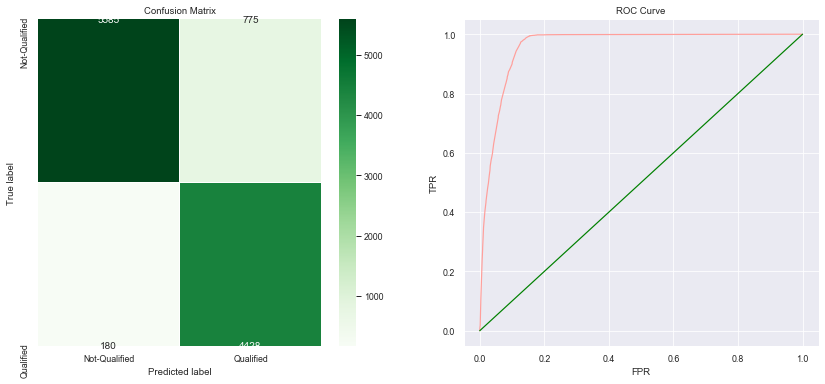

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 19, 'min_samples_split': 30}
Overall Train Accuracy 0.9284077892325315
Train AUC Score 0.9705439525874523
Overall Test Accuracy 0.9140226112326769
Test AUC Score 0.9588522899742312
Classification Report of Test
               precision    recall  f1-score   support

           0       0.98      0.87      0.92      6360
           1       0.85      0.97      0.90      4608

    accuracy                           0.91     10968
   macro avg       0.91      0.92      0.91     10968
weighted avg       0.92      0.91      0.91     10968

K-Fold scores: 0.922 (+/- 0.00001)


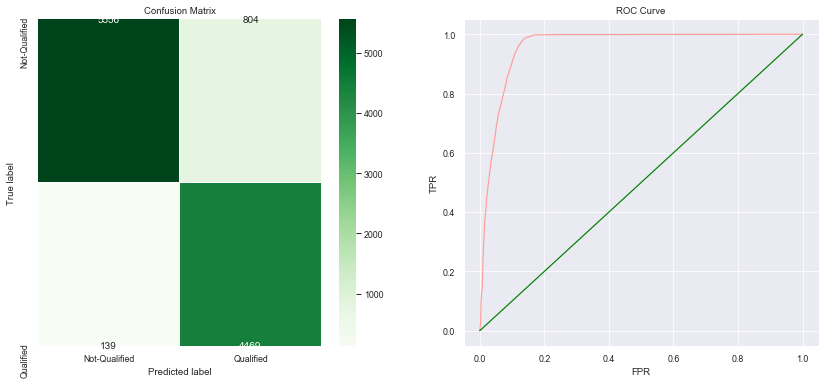

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 16, 'min_samples_split': 20}
Overall Train Accuracy 0.9231699376802158
Train AUC Score 0.9632823188046588
Overall Test Accuracy 0.912290299051787
Test AUC Score 0.9591224654415619
Classification Report of Test
               precision    recall  f1-score   support

           0       0.99      0.86      0.92      6360
           1       0.84      0.98      0.90      4608

    accuracy                           0.91     10968
   macro avg       0.91      0.92      0.91     10968
weighted avg       0.92      0.91      0.91     10968

K-Fold scores: 0.919 (+/- 0.00002)


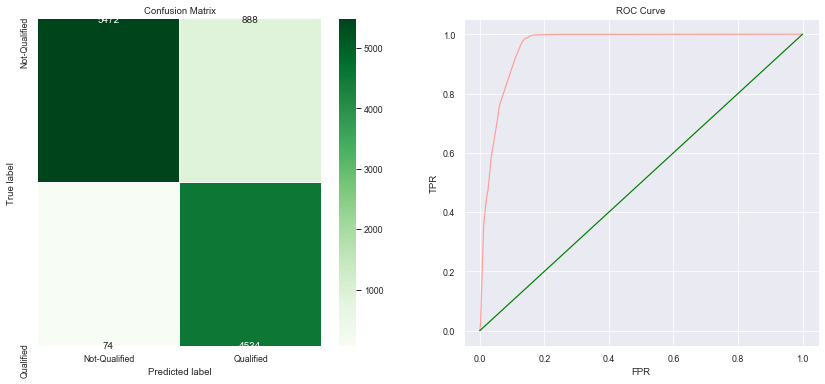

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 14, 'min_samples_split': 21}
Overall Train Accuracy 0.9257799339667139
Train AUC Score 0.9640355184037562
Overall Test Accuracy 0.9137490882567469
Test AUC Score 0.9585482487388627
Classification Report of Test
               precision    recall  f1-score   support

           0       0.98      0.87      0.92      6360
           1       0.84      0.98      0.90      4608

    accuracy                           0.91     10968
   macro avg       0.91      0.92      0.91     10968
weighted avg       0.92      0.91      0.91     10968

K-Fold scores: 0.922 (+/- 0.00000)


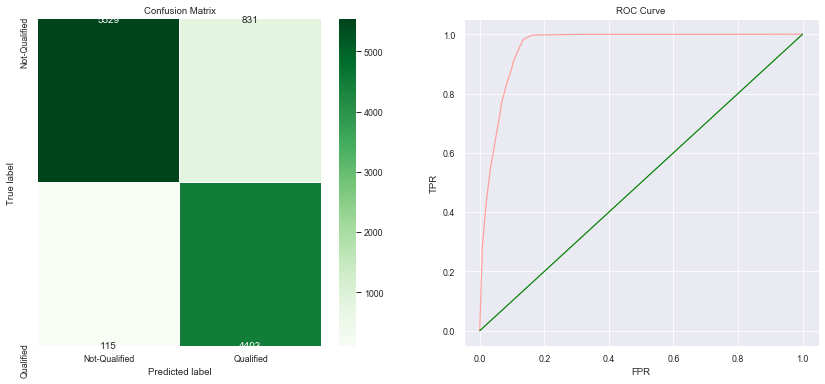

____________________________________________________________


In [86]:
xtrain_data = [X_train,df_upsampled.drop('QUALIFIED',axis = 1),df_downsampled.drop('QUALIFIED',axis = 1),X_SMOTE]
ytrain_data = [y_train,df_upsampled['QUALIFIED'],df_downsampled['QUALIFIED'],y_SMOTE]
name = ['Normal Sampling' , 'Over Sampling' , 'Under Sampling' , 'SMOTE']
index = [0,1,2,3]

for i,j,k,l in zip(xtrain_data,ytrain_data,name,index):
    print('Data is ',k,' And with hyper parameter ',param_dt[l])
    model_eval(DecisionTreeClassifier(**param_dt[l],random_state= 42), i,j,X_test,y_test)
    print("_" * 60)

#### The best score for Decision Tree is registered when trained with the SMOTE with an Test AUC score of 0.95 and Test K-Fold score of 0.922

### v) Random Forest

#### Let's first find out the best parameters for all the datasets:

In [542]:
xtrain_data = [X_train,df_upsampled.drop('QUALIFIED',axis = 1),df_downsampled.drop('QUALIFIED',axis = 1),X_SMOTE]
ytrain_data = [y_train,df_upsampled['QUALIFIED'],df_downsampled['QUALIFIED'],y_SMOTE]
name = ['Normal Sampling' , 'Over Sampling' , 'Under Sampling' , 'SMOTE']
param_rf = []
for i,j,k in zip(xtrain_data,ytrain_data,name):
    global best_rf
    best_rf =[]
    print('Data is ',k)
    # Instantiate a Random forest classifier: tree
    rfc = RandomForestClassifier(random_state = 42)

    # Setup the parameters and distributions to sample from: param_dist
    params = {'n_estimators' : sp_randint(50,200),
              'max_features' : sp_randint(1,24),'max_depth': sp_randint(2,10),
             'min_samples_leaf':sp_randint(1,20),
             'min_samples_split':sp_randint(2,20),
             'criterion':['gini','entropy']}

    # Instantiate the RandomizedSearchCV object
    rsearch_rfc = RandomizedSearchCV(rfc, param_distributions= params, cv = 5, scoring = 'roc_auc',n_iter = 200,random_state = 42,n_jobs = -1,return_train_score = True)

    # Fit it to the data
    rsearch_rfc.fit(i,j)
    best_rf.append(rsearch_rfc.best_params_)
    param_rf.append(rsearch_rfc.best_params_)
    
    print("Tuned Random Tree Parameters: {}".format(rsearch_rfc.best_params_), "for",k)
    print("_" * 100)

Data is  Normal Sampling
Tuned Random Tree Parameters: {'criterion': 'entropy', 'max_depth': 9, 'max_features': 22, 'min_samples_leaf': 1, 'min_samples_split': 12, 'n_estimators': 162} for Normal Sampling
____________________________________________________________________________________________________
Data is  Over Sampling
Tuned Random Tree Parameters: {'criterion': 'entropy', 'max_depth': 9, 'max_features': 22, 'min_samples_leaf': 1, 'min_samples_split': 12, 'n_estimators': 162} for Over Sampling
____________________________________________________________________________________________________
Data is  Under Sampling
Tuned Random Tree Parameters: {'criterion': 'entropy', 'max_depth': 9, 'max_features': 15, 'min_samples_leaf': 2, 'min_samples_split': 11, 'n_estimators': 179} for Under Sampling
____________________________________________________________________________________________________
Data is  SMOTE
Tuned Random Tree Parameters: {'criterion': 'entropy', 'max_depth': 9, 'm

In [87]:
param_rf = [{'criterion': 'entropy', 'max_depth': 9, 'max_features': 22, 'min_samples_leaf': 1, 'min_samples_split': 12, 'n_estimators': 162},
           {'criterion': 'entropy', 'max_depth': 9, 'max_features': 22, 'min_samples_leaf': 1, 'min_samples_split': 12, 'n_estimators': 162},
           {'criterion': 'entropy', 'max_depth': 9, 'max_features': 15, 'min_samples_leaf': 2, 'min_samples_split': 11, 'n_estimators': 179},
           {'criterion': 'entropy', 'max_depth': 9, 'max_features': 22, 'min_samples_leaf': 1, 'min_samples_split': 12, 'n_estimators': 162}]

Data is  Normal Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 7, 'min_samples_leaf': 16, 'min_samples_split': 24}
Overall Train Accuracy 0.9258752735229759
Train AUC Score 0.9816975294836268
Overall Test Accuracy 0.9187636761487965
Test AUC Score 0.9669716462482529
Classification Report of Test
               precision    recall  f1-score   support

           0       0.98      0.88      0.93      6360
           1       0.85      0.97      0.91      4608

    accuracy                           0.92     10968
   macro avg       0.92      0.93      0.92     10968
weighted avg       0.93      0.92      0.92     10968

K-Fold scores: 0.925 (+/- 0.00002)


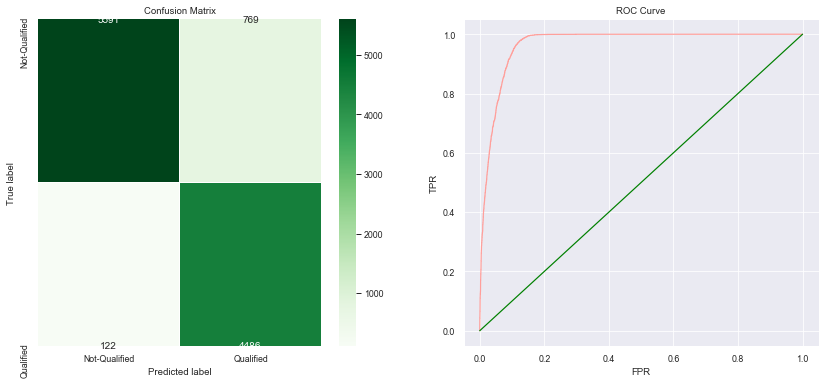

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 19, 'min_samples_split': 30}
Overall Train Accuracy 0.9353143319183344
Train AUC Score 0.9839809175789977
Overall Test Accuracy 0.9180342815463166
Test AUC Score 0.9662742673392731
Classification Report of Test
               precision    recall  f1-score   support

           0       0.98      0.87      0.93      6360
           1       0.85      0.98      0.91      4608

    accuracy                           0.92     10968
   macro avg       0.92      0.93      0.92     10968
weighted avg       0.93      0.92      0.92     10968

K-Fold scores: 0.928 (+/- 0.00002)


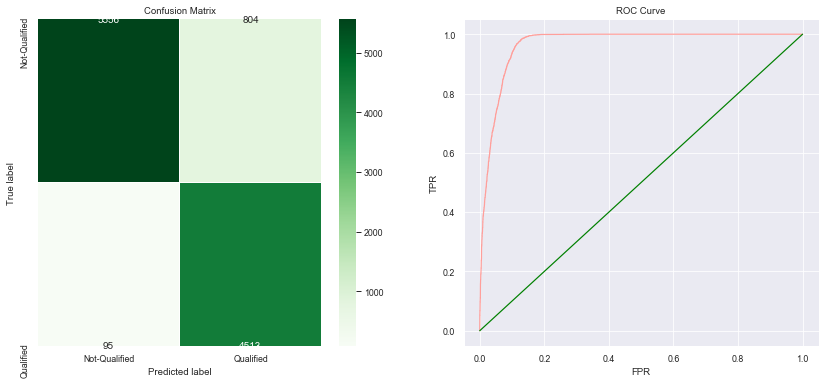

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 16, 'min_samples_split': 20}
Overall Train Accuracy 0.9280532043530835
Train AUC Score 0.9811654339600168
Overall Test Accuracy 0.9142961342086069
Test AUC Score 0.9658904325537212
Classification Report of Test
               precision    recall  f1-score   support

           0       0.99      0.86      0.92      6360
           1       0.84      0.98      0.91      4608

    accuracy                           0.91     10968
   macro avg       0.91      0.92      0.91     10968
weighted avg       0.93      0.91      0.91     10968

K-Fold scores: 0.923 (+/- 0.00002)


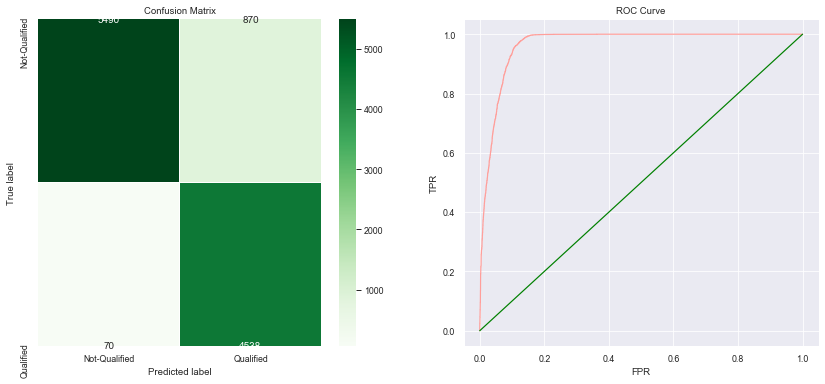

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 14, 'min_samples_split': 21}
Overall Train Accuracy 0.934135166093929
Train AUC Score 0.9837099138612707
Overall Test Accuracy 0.9172137126185266
Test AUC Score 0.9666877197436234
Classification Report of Test
               precision    recall  f1-score   support

           0       0.98      0.87      0.92      6360
           1       0.85      0.98      0.91      4608

    accuracy                           0.92     10968
   macro avg       0.92      0.93      0.92     10968
weighted avg       0.93      0.92      0.92     10968

K-Fold scores: 0.927 (+/- 0.00000)


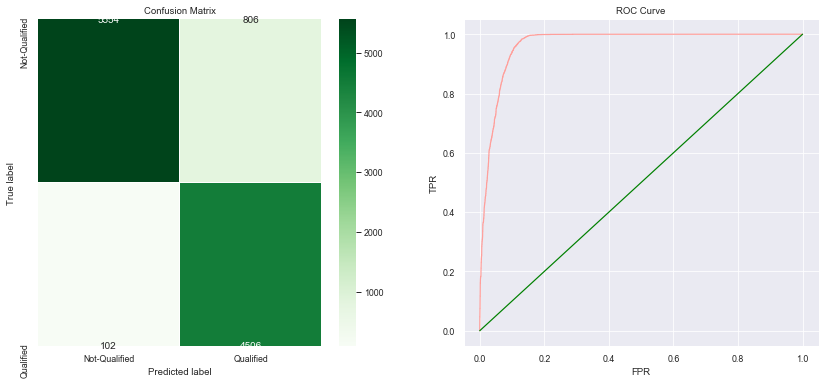

____________________________________________________________


In [88]:
xtrain_data = [X_train,df_upsampled.drop('QUALIFIED',axis = 1),df_downsampled.drop('QUALIFIED',axis = 1),X_SMOTE]
ytrain_data = [y_train,df_upsampled['QUALIFIED'],df_downsampled['QUALIFIED'],y_SMOTE]
name = ['Normal Sampling' , 'Over Sampling' , 'Under Sampling' , 'SMOTE']
index = [0,1,2,3]

for i,j,k,l in zip(xtrain_data,ytrain_data,name,index):
    print('Data is ',k,' And with hyper parameter ',param_dt[l])
    model_eval(RandomForestClassifier(**param_rf[l],random_state= 42), i,j,X_test,y_test)
    print("_" * 60)

#### The best score for Random forest is registered when trained with the SMOTE data with an Test AUC score of 0.77 and train K-Fold score of 0.85

### vi) AdaBoost Classifier

#### Let's first find out the best parameters for all the datasets:

In [543]:
xtrain_data = [X_train,df_upsampled.drop('QUALIFIED',axis = 1),df_downsampled.drop('QUALIFIED',axis = 1),X_SMOTE]
ytrain_data = [y_train,df_upsampled['QUALIFIED'],df_downsampled['QUALIFIED'],y_SMOTE]
name = ['Normal Sampling' , 'Over Sampling' , 'Under Sampling' , 'SMOTE']
param_ada = []
for i,j,k in zip(xtrain_data,ytrain_data,name):
    global best_ada
    best_ada =[]
    print('Data is ',k)
    # Instantiate a Ada Boost classifier
    ada = AdaBoostClassifier()

    #Creating a grid of hyperparameters
    param_grid = {'n_estimators': [200,300],
                  'algorithm': ['SAMME', 'SAMME.R'],
                  'learning_rate' : [0.5, 0.75, 1.0]}

    #Building a 5 fold CV GridSearchCV object
    grid_ada = GridSearchCV(ada, param_grid, scoring = 'accuracy', cv=5,n_jobs = -1)

    #Fitting the grid to the training data
    grid_ada.fit(i,j)
    best_ada.append(grid_ada.best_params_)
    param_ada.append(grid_ada.best_params_)
    
    print("Tuned Ada Boost Parameters: {}".format(grid_ada.best_params_), "for",k)
    print("_" * 100)

Data is  Normal Sampling
Tuned Ada Boost Parameters: {'algorithm': 'SAMME.R', 'learning_rate': 0.75, 'n_estimators': 300} for Normal Sampling
____________________________________________________________________________________________________
Data is  Over Sampling
Tuned Ada Boost Parameters: {'algorithm': 'SAMME.R', 'learning_rate': 1.0, 'n_estimators': 300} for Over Sampling
____________________________________________________________________________________________________
Data is  Under Sampling
Tuned Ada Boost Parameters: {'algorithm': 'SAMME.R', 'learning_rate': 0.5, 'n_estimators': 300} for Under Sampling
____________________________________________________________________________________________________
Data is  SMOTE
Tuned Ada Boost Parameters: {'algorithm': 'SAMME.R', 'learning_rate': 0.75, 'n_estimators': 300} for SMOTE
____________________________________________________________________________________________________


In [89]:
param_ada = [{'algorithm': 'SAMME', 'learning_rate': 0.75, 'n_estimators': 300},
            {'algorithm': 'SAMME.R', 'learning_rate': 1.0, 'n_estimators': 300},
            {'algorithm': 'SAMME.R', 'learning_rate': 0.5, 'n_estimators': 200},
            {'algorithm': 'SAMME.R', 'learning_rate': 0.75, 'n_estimators': 300}]

Data is  Normal Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 7, 'min_samples_leaf': 16, 'min_samples_split': 24}
Overall Train Accuracy 0.9101672397624258
Train AUC Score 0.9624992489294845
Overall Test Accuracy 0.9095550692924872
Test AUC Score 0.9595612190721087
Classification Report of Test
               precision    recall  f1-score   support

           0       0.98      0.86      0.92      6360
           1       0.84      0.97      0.90      4608

    accuracy                           0.91     10968
   macro avg       0.91      0.92      0.91     10968
weighted avg       0.92      0.91      0.91     10968

K-Fold scores: 0.918 (+/- 0.00002)


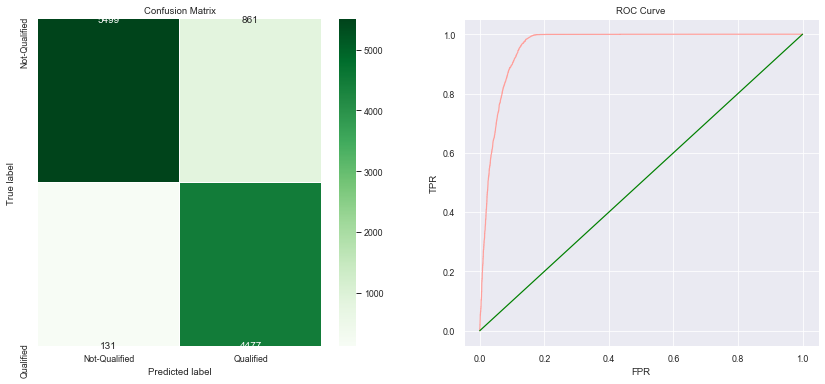

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 19, 'min_samples_split': 30}
Overall Train Accuracy 0.9227814837275117
Train AUC Score 0.967995605063381
Overall Test Accuracy 0.9113785557986871
Test AUC Score 0.9615568426253495
Classification Report of Test
               precision    recall  f1-score   support

           0       0.98      0.87      0.92      6360
           1       0.84      0.97      0.90      4608

    accuracy                           0.91     10968
   macro avg       0.91      0.92      0.91     10968
weighted avg       0.92      0.91      0.91     10968

K-Fold scores: 0.921 (+/- 0.00002)


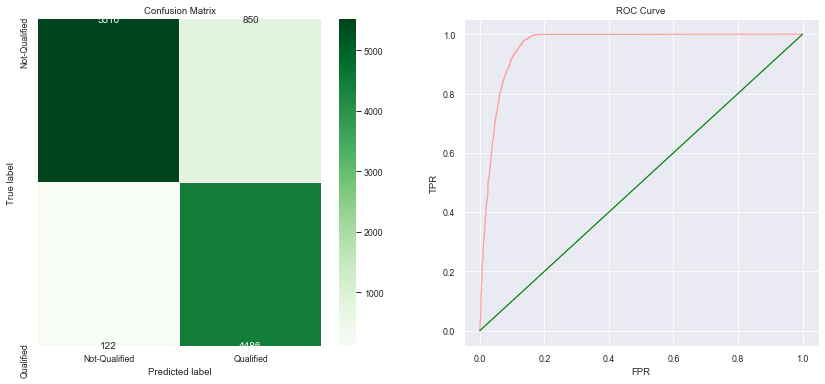

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 16, 'min_samples_split': 20}
Overall Train Accuracy 0.9207515579946052
Train AUC Score 0.9654261059884923
Overall Test Accuracy 0.9097374179431073
Test AUC Score 0.9611520059453615
Classification Report of Test
               precision    recall  f1-score   support

           0       0.99      0.86      0.92      6360
           1       0.83      0.98      0.90      4608

    accuracy                           0.91     10968
   macro avg       0.91      0.92      0.91     10968
weighted avg       0.92      0.91      0.91     10968

K-Fold scores: 0.920 (+/- 0.00003)


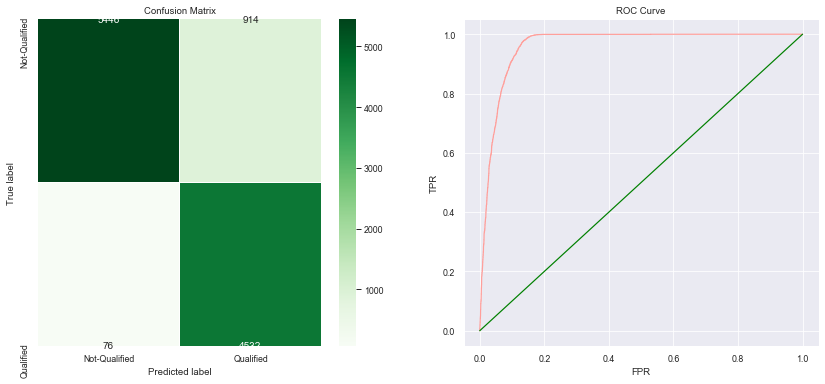

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 14, 'min_samples_split': 21}
Overall Train Accuracy 0.923960649551917
Train AUC Score 0.9707296212343712
Overall Test Accuracy 0.9100109409190372
Test AUC Score 0.9610549809464537
Classification Report of Test
               precision    recall  f1-score   support

           0       0.98      0.87      0.92      6360
           1       0.84      0.97      0.90      4608

    accuracy                           0.91     10968
   macro avg       0.91      0.92      0.91     10968
weighted avg       0.92      0.91      0.91     10968

K-Fold scores: 0.923 (+/- 0.00001)


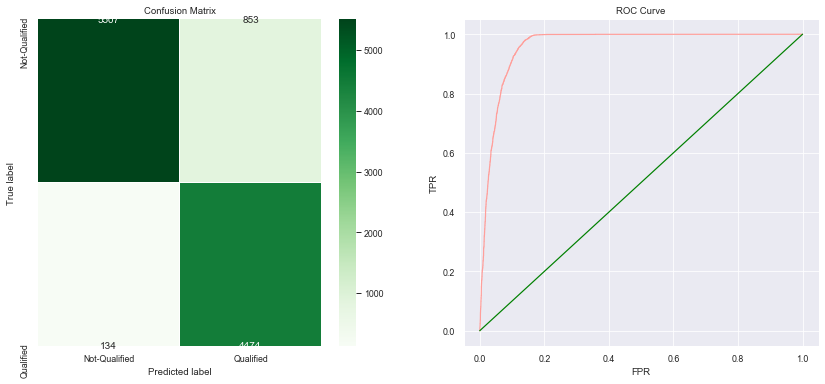

____________________________________________________________


In [90]:
xtrain_data = [X_train,df_upsampled.drop('QUALIFIED',axis = 1),df_downsampled.drop('QUALIFIED',axis = 1),X_SMOTE]
ytrain_data = [y_train,df_upsampled['QUALIFIED'],df_downsampled['QUALIFIED'],y_SMOTE]
name = ['Normal Sampling' , 'Over Sampling' , 'Under Sampling' , 'SMOTE']
index = [0,1,2,3]

for i,j,k,l in zip(xtrain_data,ytrain_data,name,index):
    print('Data is ',k,' And with hyper parameter ',param_dt[l])
    model_eval(AdaBoostClassifier(**param_ada[l]), i,j,X_test,y_test)
    print("_" * 60)

#### The best score for Adaboost Classifier is registered when trained with the SMOTE data with an Test AUC score of 0.764 and train K-Fold score of 0.86

### vii) GradientBoosting Classifier

#### Let's first find out the best parameters for all the datasets:

In [544]:
xtrain_data = [X_train,df_upsampled.drop('QUALIFIED',axis = 1),df_downsampled.drop('QUALIFIED',axis = 1),X_SMOTE]
ytrain_data = [y_train,df_upsampled['QUALIFIED'],df_downsampled['QUALIFIED'],y_SMOTE]
name = ['Normal Sampling' , 'Over Sampling' , 'Under Sampling' , 'SMOTE']
param_gbc = []
for i,j,k in zip(xtrain_data,ytrain_data,name):
    global best_gbc
    best_gbc =[]
    print('Data is ',k)
    # Instantiate a Gradient Boost classifier
    gbc = GradientBoostingClassifier()

    #Creating a grid of hyperparameters
    param_grid = {'n_estimators': [200,300],
                  'learning_rate' : [0.5, 0.75, 1.0]}

    #Building a 5 fold CV GridSearchCV object
    grid_gbc = GridSearchCV(gbc, param_grid, scoring = 'accuracy', cv=5,n_jobs = -1)

    #Fitting the grid to the training data
    grid_gbc.fit(i,j)
    best_gbc.append(grid_gbc.best_params_)
    param_gbc.append(grid_gbc.best_params_)
    
    print("Tuned Random Tree Parameters: {}".format(grid_gbc.best_params_), "for",k)
    print("_" * 100)

Data is  Normal Sampling
Tuned Random Tree Parameters: {'learning_rate': 0.5, 'n_estimators': 200} for Normal Sampling
____________________________________________________________________________________________________
Data is  Over Sampling
Tuned Random Tree Parameters: {'learning_rate': 0.5, 'n_estimators': 300} for Over Sampling
____________________________________________________________________________________________________
Data is  Under Sampling
Tuned Random Tree Parameters: {'learning_rate': 0.5, 'n_estimators': 200} for Under Sampling
____________________________________________________________________________________________________
Data is  SMOTE
Tuned Random Tree Parameters: {'learning_rate': 0.5, 'n_estimators': 200} for SMOTE
____________________________________________________________________________________________________


In [91]:
param_gbc = [{'learning_rate': 0.5, 'n_estimators': 200},
            {'learning_rate': 0.5, 'n_estimators': 300},
            {'learning_rate': 0.5, 'n_estimators': 200},
            {'learning_rate': 0.5, 'n_estimators': 200}]

Data is  Normal Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 7, 'min_samples_leaf': 16, 'min_samples_split': 24}
Overall Train Accuracy 0.9426383244763988
Train AUC Score 0.9856759673185003
Overall Test Accuracy 0.9151167031363968
Test AUC Score 0.9643162799997815
Classification Report of Test
               precision    recall  f1-score   support

           0       0.96      0.89      0.92      6360
           1       0.87      0.94      0.90      4608

    accuracy                           0.92     10968
   macro avg       0.91      0.92      0.91     10968
weighted avg       0.92      0.92      0.92     10968

K-Fold scores: 0.918 (+/- 0.00001)


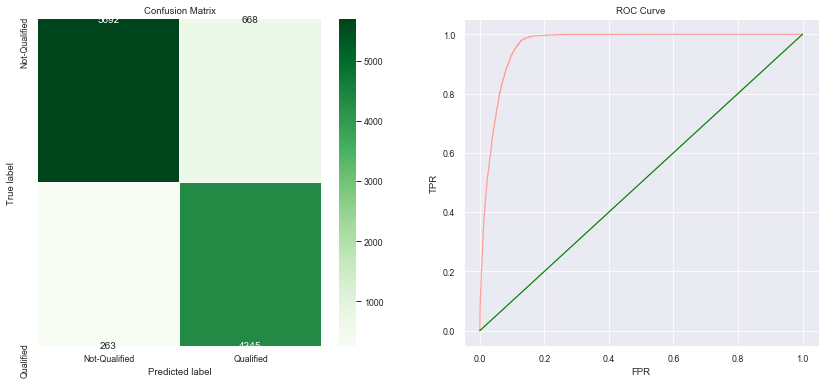

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 19, 'min_samples_split': 30}
Overall Train Accuracy 0.9490937268378141
Train AUC Score 0.9853602534052295
Overall Test Accuracy 0.9148431801604668
Test AUC Score 0.9631814782058001
Classification Report of Test
               precision    recall  f1-score   support

           0       0.96      0.89      0.92      6360
           1       0.86      0.95      0.90      4608

    accuracy                           0.91     10968
   macro avg       0.91      0.92      0.91     10968
weighted avg       0.92      0.91      0.92     10968

K-Fold scores: 0.931 (+/- 0.00001)


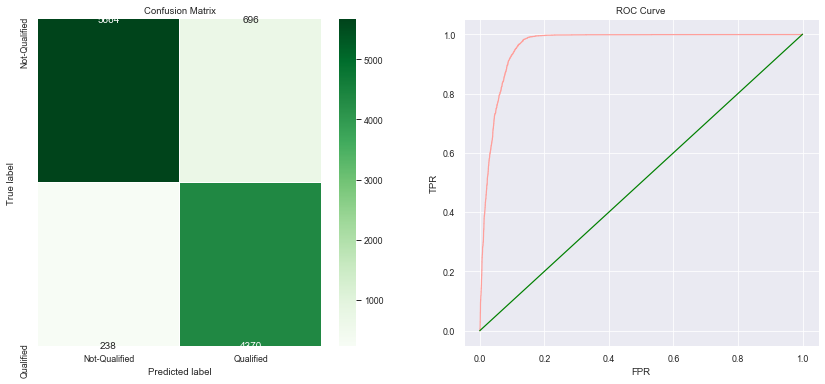

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 16, 'min_samples_split': 20}
Overall Train Accuracy 0.9488419681890057
Train AUC Score 0.9880979115786104
Overall Test Accuracy 0.9163931436907367
Test AUC Score 0.9631355504236547
Classification Report of Test
               precision    recall  f1-score   support

           0       0.97      0.88      0.92      6360
           1       0.86      0.96      0.91      4608

    accuracy                           0.92     10968
   macro avg       0.91      0.92      0.92     10968
weighted avg       0.92      0.92      0.92     10968

K-Fold scores: 0.917 (+/- 0.00004)


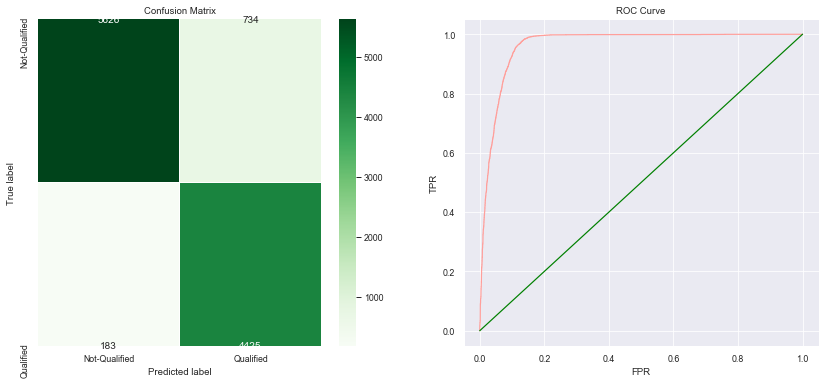

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 14, 'min_samples_split': 21}
Overall Train Accuracy 0.9485546796038002
Train AUC Score 0.9880354355725981
Overall Test Accuracy 0.9163931436907367
Test AUC Score 0.9647118697043151
Classification Report of Test
               precision    recall  f1-score   support

           0       0.96      0.89      0.93      6360
           1       0.86      0.95      0.91      4608

    accuracy                           0.92     10968
   macro avg       0.91      0.92      0.92     10968
weighted avg       0.92      0.92      0.92     10968

K-Fold scores: 0.925 (+/- 0.00000)


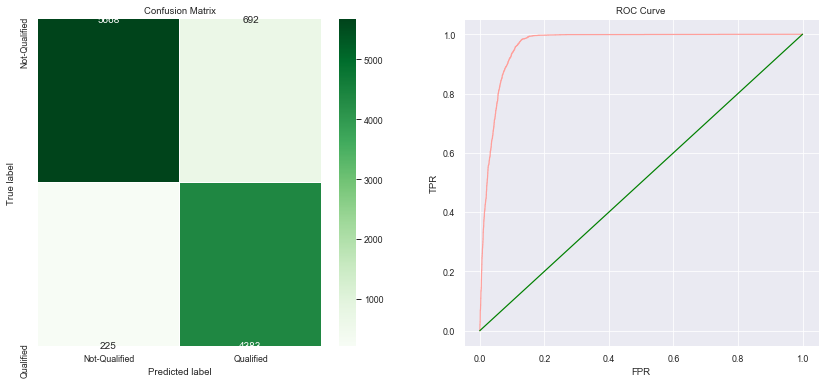

____________________________________________________________


In [92]:
for i,j,k,l in zip(xtrain_data,ytrain_data,name,index):
    print('Data is ',k,' And with hyper parameter ',param_dt[l])
    model_eval(GradientBoostingClassifier(**param_gbc[l]), i,j,X_test,y_test)
    print("_" * 60)

#### The best score for Gradient Boost Classifier is registered when trained with the SMOTE data with an Test AUC score of 0.747 and train K-Fold score of 0.85 after it was standardized

### viii) XGBoost Classifier

#### Let's first find out the best parameters for all the datasets:

In [82]:
xtrain_data = [X_train,df_upsampled.drop('QUALIFIED',axis = 1),df_downsampled.drop('QUALIFIED',axis = 1),X_SMOTE]
ytrain_data = [y_train,df_upsampled['QUALIFIED'],df_downsampled['QUALIFIED'],y_SMOTE]
name = ['Normal Sampling' , 'Over Sampling' , 'Under Sampling' , 'SMOTE']
param_xgb = []
for i,j,k in zip(xtrain_data,ytrain_data,name):
    global best_xgb
    best_xgb =[]
    print('Data is ',k)  # Instantiate a XGBoost classifier
    xgb= XGBClassifier()

    param_grid = {"learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30] ,
                  "max_depth"        : [3, 4, 5, 6, 8, 10, 12, 15],
                 "min_child_weight" : [1, 3, 5, 7],
                 "gamma"            : [0.0, 0.1, 0.2 , 0.3, 0.4],
                 "colsample_bytree" : [0.3, 0.4, 0.5 , 0.7] }

    #Building a 5 fold CV GridSearchCV object
    xgb_RS = RandomizedSearchCV(xgb, param_grid ,cv = 5, scoring = 'roc_auc',n_iter = 200,n_jobs = -1)

    #Fitting the grid to the training data
    xgb_RS.fit(i,j)
    best_xgb.append(xgb_RS.best_params_)
    param_xgb.append(xgb_RS.best_params_)
    
    print("Tuned XG Boost Parameters: {}".format(xgb_RS.best_params_), "for",k)
    print("_" * 100)

Data is  Normal Sampling
Tuned XG Boost Parameters: {'min_child_weight': 1, 'max_depth': 6, 'learning_rate': 0.15, 'gamma': 0.3, 'colsample_bytree': 0.7} for Normal Sampling
____________________________________________________________________________________________________
Data is  Over Sampling
Tuned XG Boost Parameters: {'min_child_weight': 1, 'max_depth': 15, 'learning_rate': 0.1, 'gamma': 0.4, 'colsample_bytree': 0.4} for Over Sampling
____________________________________________________________________________________________________
Data is  Under Sampling
Tuned XG Boost Parameters: {'min_child_weight': 5, 'max_depth': 6, 'learning_rate': 0.1, 'gamma': 0.2, 'colsample_bytree': 0.7} for Under Sampling
____________________________________________________________________________________________________
Data is  SMOTE
Tuned XG Boost Parameters: {'min_child_weight': 1, 'max_depth': 8, 'learning_rate': 0.15, 'gamma': 0.4, 'colsample_bytree': 0.4} for SMOTE
____________________________

In [93]:
param_xgb = [{'min_child_weight': 1, 'max_depth': 6, 'learning_rate': 0.15, 'gamma': 0.3, 'colsample_bytree': 0.7} ,
            {'min_child_weight': 1, 'max_depth': 15, 'learning_rate': 0.1, 'gamma': 0.4, 'colsample_bytree': 0.4},
            {'min_child_weight': 5, 'max_depth': 6, 'learning_rate': 0.1, 'gamma': 0.2, 'colsample_bytree': 0.7},
            {'min_child_weight': 1, 'max_depth': 8, 'learning_rate': 0.15, 'gamma': 0.4, 'colsample_bytree': 0.4}]

Data is  Normal Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 7, 'min_samples_leaf': 16, 'min_samples_split': 24}
Overall Train Accuracy 0.9382619568615193
Train AUC Score 0.984805950798678
Overall Test Accuracy 0.9186725018234865
Test AUC Score 0.96870861040138
Classification Report of Test
               precision    recall  f1-score   support

           0       0.97      0.89      0.93      6360
           1       0.86      0.96      0.91      4608

    accuracy                           0.92     10968
   macro avg       0.92      0.92      0.92     10968
weighted avg       0.92      0.92      0.92     10968

K-Fold scores: 0.924 (+/- 0.00002)


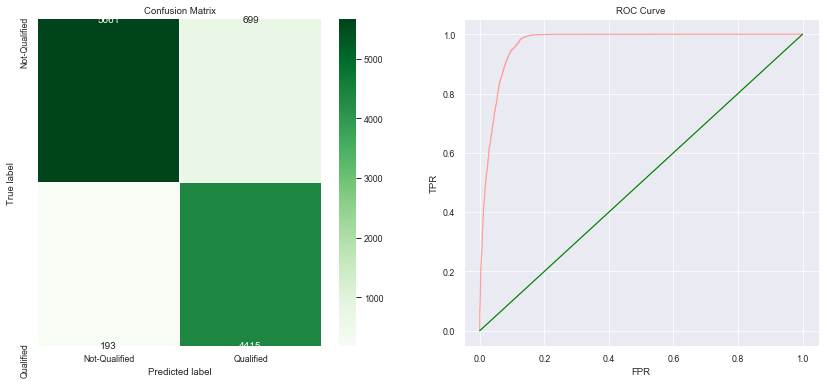

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 19, 'min_samples_split': 30}
Overall Train Accuracy 0.994912741728994
Train AUC Score 0.9998945223928593
Overall Test Accuracy 0.9147520058351568
Test AUC Score 0.9655430909056166
Classification Report of Test
               precision    recall  f1-score   support

           0       0.95      0.90      0.92      6360
           1       0.87      0.94      0.90      4608

    accuracy                           0.91     10968
   macro avg       0.91      0.92      0.91     10968
weighted avg       0.92      0.91      0.92     10968

K-Fold scores: 0.934 (+/- 0.00001)


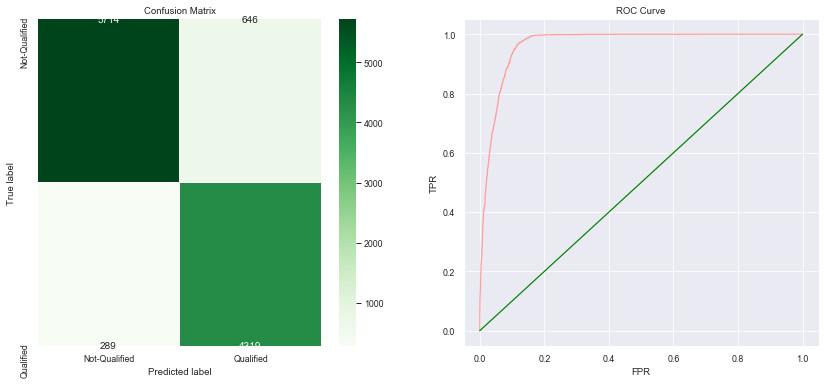

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 16, 'min_samples_split': 20}
Overall Train Accuracy 0.9343781973769882
Train AUC Score 0.9806765773750987
Overall Test Accuracy 0.9194930707512764
Test AUC Score 0.9673011593182215
Classification Report of Test
               precision    recall  f1-score   support

           0       0.98      0.88      0.93      6360
           1       0.85      0.98      0.91      4608

    accuracy                           0.92     10968
   macro avg       0.92      0.93      0.92     10968
weighted avg       0.93      0.92      0.92     10968

K-Fold scores: 0.925 (+/- 0.00002)


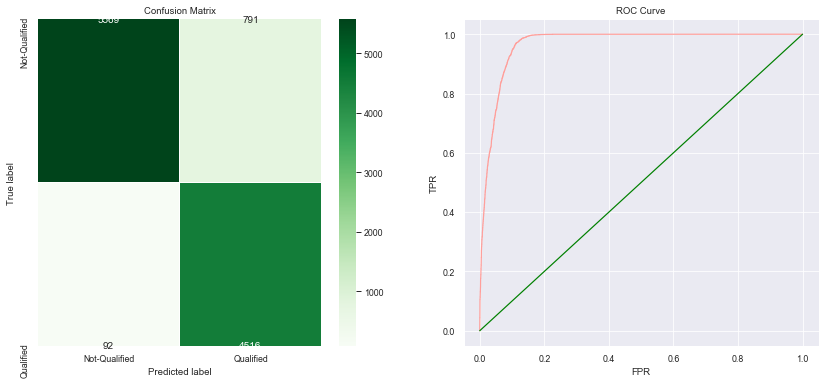

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 14, 'min_samples_split': 21}
Overall Train Accuracy 0.9576847921299104
Train AUC Score 0.9942475545001801
Overall Test Accuracy 0.9194930707512764
Test AUC Score 0.9674175654317347
Classification Report of Test
               precision    recall  f1-score   support

           0       0.97      0.89      0.93      6360
           1       0.86      0.96      0.91      4608

    accuracy                           0.92     10968
   macro avg       0.92      0.93      0.92     10968
weighted avg       0.92      0.92      0.92     10968

K-Fold scores: 0.929 (+/- 0.00001)


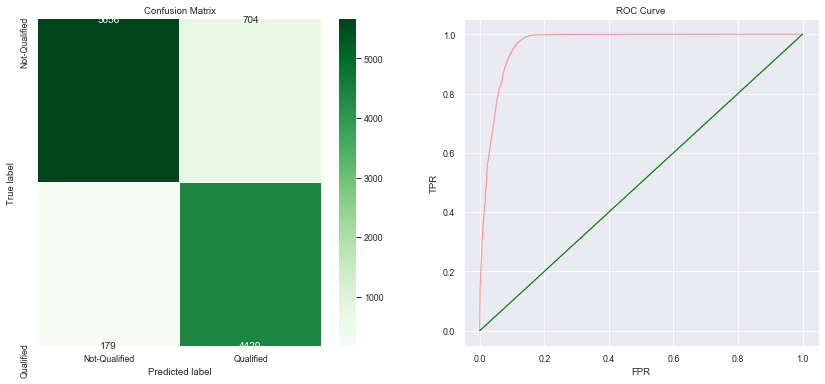

____________________________________________________________


In [94]:
for i,j,k,l in zip(xtrain_data,ytrain_data,name,index):
    print('Data is ',k,' And with hyper parameter ',param_dt[l])
    model_eval(XGBClassifier(**param_xgb[l]), i,j,X_test,y_test)
    print("_" * 60)

In [95]:
X_SMOTE.columns

Index(['BATHRM', 'HF_BATHRM', 'HEAT', 'AC', 'ROOMS', 'BEDRM', 'AYB', 'YR_RMDL',
       'EYB', 'PRICE', 'SALE_NUM', 'GBA', 'BLDG_NUM', 'STYLE', 'STRUCT',
       'GRADE', 'CNDTN', 'EXTWALL', 'ROOF', 'INTWALL', 'KITCHENS',
       'FIREPLACES', 'USECODE', 'LANDAREA', 'SALEYEAR'],
      dtype='object')

#### The best score for XG Boost Classifier is registered when trained with the under sampling data with an Test AUC score of 0.78 and train K-Fold score of 0.716 after it was standardized

# 6) Conclusion:

### The models are performing well for SMOTE data and also undersampled data rather than imbalanced data. Thus before modeling resampling techniques should be used to make sure that the models are not biased.

### Let's see the top 5 most scoring models

In [99]:
dic = {'Model':['XGboost','Random forest','Ada Boost','Gradient Boost','Decision Tree'],
       'Data':['SMOTE','SMOTE','SMOTE','SMOTE','Under Sampling'],
       'Accuracy':[0.76,0.81,0.81,0.80,0.78],
       'K-Fold score':[0.71,0.85,0.86,0.85,0.70],
       'AUC-ROC Score':[0.78,0.77,0.76,0.74,0.74]}
score_df = pd.DataFrame(dic)
fig =  ff.create_table(score_df)
fig.show()

### Let's see the feature importance of our best model

In [96]:
def plot_Feature(feature, clf):
    tmp = pd.DataFrame({'Feature': feature, 
                        'Feature importance': clf.feature_importances_})
    tmp = tmp.sort_values(by='Feature importance',ascending=False)
    fig = go.Figure(go.Bar(
    x=tmp['Feature'],y=tmp['Feature importance'],marker={'color': tmp['Feature importance'], 
    'colorscale': 'Viridis'}
    ))
    fig.update_layout(title_text='Feature Importance',xaxis_title="Feature",yaxis_title="Importance")
    return fig.show()

In [97]:
param_r = {'criterion': 'entropy', 'max_depth': 9, 'max_features': 22, 'min_samples_leaf': 1, 'min_samples_split': 12, 'n_estimators': 162}
rfc_s = RandomForestClassifier(**param_r,random_state = 42).fit(X_SMOTE,y_SMOTE)

In [98]:
plot_Feature(X_SMOTE.columns,rfc_s)

In [101]:
final_col = X_SMOTE.columns

In [133]:
results = pd.read_csv('C:\\Users\\suraj\\Downloads\\Assignment-UnknownDataset.csv')

In [150]:
result = pd.read_csv('C:\\Users\\suraj\\Downloads\\Assignment-UnknownDataset.csv')

result.head(5)

,row ID,BATHRM,HF_BATHRM,HEAT,HEAT_D,AC,NUM_UNITS,ROOMS,BEDRM,AYB,YR_RMDL,EYB,STORIES,SALEDATE,PRICE,SALE_NUM,GBA,BLDG_NUM,STYLE,STYLE_D,STRUCT,STRUCT_D,GRADE,GRADE_D,CNDTN,CNDTN_D,EXTWALL,EXTWALL_D,ROOF,ROOF_D,INTWALL,INTWALL_D,KITCHENS,FIREPLACES,USECODE,LANDAREA,GIS_LAST_MOD_DTTM
0,Row0,4.0,0.0,7.0,Warm Cool,Y,2.0,8.0,4.0,1910.0,1988.0,1972,3.0,2003-11-25T00:00:00.000Z,1095000.0,1,2522,1,7.0,3 Story,7.0,Row Inside,6.0,Very Good,4.0,Good,14.0,Common Brick,6.0,Metal- Sms,6.0,Hardwood,2.0,5.0,24,1680,2018-07-22T18:01:43.000Z
1,Row1,3.0,1.0,13.0,Hot Water Rad,Y,2.0,8.0,5.0,1900.0,2003.0,1984,3.0,2006-07-12T00:00:00.000Z,1602000.0,1,2484,1,7.0,3 Story,7.0,Row Inside,6.0,Very Good,4.0,Good,14.0,Common Brick,2.0,Built Up,6.0,Hardwood,2.0,3.0,24,1680,2018-07-22T18:01:43.000Z
2,Row2,1.0,0.0,7.0,Warm Cool,Y,2.0,5.0,2.0,1917.0,1988.0,1957,2.0,2011-05-02T00:00:00.000Z,0.0,1,1260,1,4.0,2 Story,7.0,Row Inside,4.0,Above Average,3.0,Average,14.0,Common Brick,6.0,Metal- Sms,6.0,Hardwood,2.0,0.0,24,1261,2018-07-22T18:01:43.000Z
3,Row3,3.0,1.0,13.0,Hot Water Rad,Y,2.0,8.0,4.0,1906.0,2011.0,1972,3.0,2011-09-29T00:00:00.000Z,1050000.0,1,2401,1,7.0,3 Story,7.0,Row Inside,6.0,Very Good,3.0,Average,14.0,Common Brick,6.0,Metal- Sms,6.0,Hardwood,2.0,1.0,24,1627,2018-07-22T18:01:43.000Z
4,Row4,1.0,1.0,13.0,Hot Water Rad,Y,1.0,6.0,2.0,1908.0,1979.0,1950,2.0,2008-12-05T00:00:00.000Z,0.0,1,1590,1,4.0,2 Story,7.0,Row Inside,5.0,Good Quality,3.0,Average,14.0,Common Brick,2.0,Built Up,6.0,Hardwood,1.0,0.0,11,1424,2018-07-22T18:01:43.000Z


In [151]:
result['SALEYEAR'] = result['SALEDATE'].apply(lambda x : str(x)[0:4])
#result = result.drop(['SALEDATE'], axis=1)
#result = result[final_col]

In [152]:
total = result.isnull().sum().sort_values(ascending=False)
percent = (result.isnull().sum()/result.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(30)

,Total,Percent
YR_RMDL,17235,0.536131
PRICE,5782,0.179861
STORIES,22,0.000684
ROOMS,12,0.000373
GRADE,7,0.000218
BEDRM,7,0.000218
NUM_UNITS,7,0.000218
AC,7,0.000218
HEAT_D,7,0.000218
HEAT,7,0.000218


In [153]:
#result = result.dropna(subset=['FIREPLACES','ROOMS','AYB','BEDRM','HF_BATHRM','KITCHENS'])
result.reset_index(inplace = True, drop = True)
result['PRICE'] = result['PRICE'].fillna(value = result['PRICE'].median())
result['YR_RMDL'] = result['YR_RMDL'].fillna(value = "nan")

for i in range(len(result)):
    if result.loc[i,'YR_RMDL'] == "nan":
        result.loc[i,'YR_RMDL'] = result.loc[i,'SALEDATE'].split('-')[0]

In [149]:
result['ROOMS'].isnull().any()

True

In [154]:
result = result[final_col]

total = result.isnull().sum().sort_values(ascending=False)
percent = (result.isnull().sum()/result.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(30)

,Total,Percent
ROOMS,12,0.000373
BATHRM,7,0.000218
GRADE,7,0.000218
BEDRM,7,0.000218
AC,7,0.000218
HEAT,7,0.000218
STYLE,7,0.000218
STRUCT,7,0.000218
CNDTN,7,0.000218
EXTWALL,7,0.000218


In [ ]:
for i in result.columns:
    if result[i].isnull().any() == True:
        result[i] = result[i].fillna(value = result[i].median())

In [126]:
result['AC'] = result['AC'].apply(lambda x : 0 if x == "N" else 1)

In [127]:
result['PRICE'] = result['PRICE'] ** (1/2)
result['GBA'],l = st.boxcox(result['GBA'] + 1)
result['LANDAREA'],m = st.boxcox(result['LANDAREA'] + 1)

In [128]:
result = result[final_col]

In [129]:
result = result.astype('int')

In [131]:
param_xgb = {'min_child_weight': 1, 'max_depth': 8, 'learning_rate': 0.15,
             'gamma': 0.4, 'colsample_bytree': 0.4}

xgbb = XGBClassifier(**param_xgb).fit(X_SMOTE,y_SMOTE)

y_pred = xgbb.predict(result)

In [132]:
y_pred

array([1, 1, 0, ..., 0, 1, 0], dtype=int64)

In [138]:
submission = pd.DataFrame(list(zip(results['row ID'], y_pred)),columns =['Row ID', 'Predict-Qualified'])
submission.head()

,Row ID,Predict-Qualified
0,Row0,1
1,Row1,1
2,Row2,0
3,Row3,1
4,Row4,0


In [140]:
submission.to_csv("Assignment-Kaggle-Submission.csv",index = False)